In [1]:
import pandas as pd
import numpy as np
import seaborn as sns

df = pd.read_csv('../data/raw/fullpilot1466.csv')
df2 = pd.read_csv('../data/raw/fullpilot13_22.csv')

df = df[df.expName.isin(['FullPilot12', 'FullPilot13', 'FullPilot14'])]
df2 = df2[df2.expName.isin(['FullPilot12', 'FullPilot13'])]

df = df.groupby('prolificID').filter(lambda x: len(x) >= 483)
df2 = df2.groupby('prolificID').filter(lambda x: len(x) >= 483)

df = pd.concat([df, df2])
# df = df.groupby('prolificID').filter(lambda x: len(x) <= 432)
# keep  prolificIDs that are more than 10 characters
df = df[df.prolificID.str.len() > 10]
# show prolificIDs

expName = 'FullPilot12'
expName = ['FullPilot12', 'FullPilot13', 'FullPilot14']



df['opti_ss'] = ((df.m1 > df.m2) & (df.choice==1)) | ((df.m1 < df.m2) & (df.choice==2))
df['opti_ff'] = ((df.p1 > df.p2) & (df.choice==1)) | ((df.p1 < df.p2) & (df.choice==2))
df['opti_ev'] = ((df.ev1 > df.ev2) & (df.choice==1)) | ((df.ev1 < df.ev2) & (df.choice==2))
df['chosen_p'] = np.where(df.choice == 1, df.p1, df.p2)
df['chosen_m'] = np.where(df.choice == 1, df.m1, df.m2)

df.loc[df.expName=='FullPilot14', 'destroyed'] = 1
df['outcome'] = (df.outcome1 * (df.choice == 1) * df.destroyed) + (df.outcome2 * (df.choice == 2) * df.destroyed)
# non obtained outcomes
df['no_outcome'] = (df.outcome1 * (df.choice == 1) * (df.destroyed == 0)) + (df.outcome2 * (df.choice == 2) * (df.destroyed == 0))

# fullpilot13 gets outcome/2 when not destroyed
df.loc[(df.expName=='FullPilot13') & (df.destroyed == 0), 'outcome'] = \
    df[(df.expName=='FullPilot13') & (df.destroyed == 0)].no_outcome / 2



df = df[df.expName.isin(expName)]
print(f'N = {len(df.prolificID.unique())}')



N = 190


C:\Users\basil\AppData\Local\Temp\ipykernel_25632\3077731990.py:37: FutureWarning: Setting an item of incompatible dtype is deprecated and will raise an error in a future version of pandas. Value '[250.  250.  250.  ... 369.  134.5 301.5]' has dtype incompatible with int64, please explicitly cast to a compatible dtype first.
  df.loc[(df.expName=='FullPilot13') & (df.destroyed == 0), 'outcome'] = \


p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

FullPilot13 vs. FullPilot14: t-test independent samples, P_val:1.516e-04 t=3.906e+00
FullPilot12 vs. FullPilot13: t-test independent samples, P_val:9.489e-50 t=2.483e+01
FullPilot12 vs. FullPilot14: t-test independent samples, P_val:5.176e-81 t=4.712e+01


C:\Users\basil\AppData\Local\Temp\ipykernel_12092\755690520.py:11: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.pointplot(x='expName', y='outcome', data=data, join=False, errorbar='sd',
C:\Users\basil\AppData\Local\Temp\ipykernel_12092\755690520.py:11: UserWarning: 

The `join` parameter is deprecated and will be removed in v0.15.0. You can remove the line between points with `linestyle='none'`.

  ax = sns.pointplot(x='expName', y='outcome', data=data, join=False, errorbar='sd',
C:\Users\basil\AppData\Local\Temp\ipykernel_12092\755690520.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.stripplot(x='expName', y='outcome', data=data, palette=['C0', 'C1', 'C2'], alpha=0.3, jitter=True, ax=ax)


(<Axes: xlabel='expName', ylabel='average reward obtained per subject'>,
  <statannotations.Annotation.Annotation at 0x2112dfc9a60>])

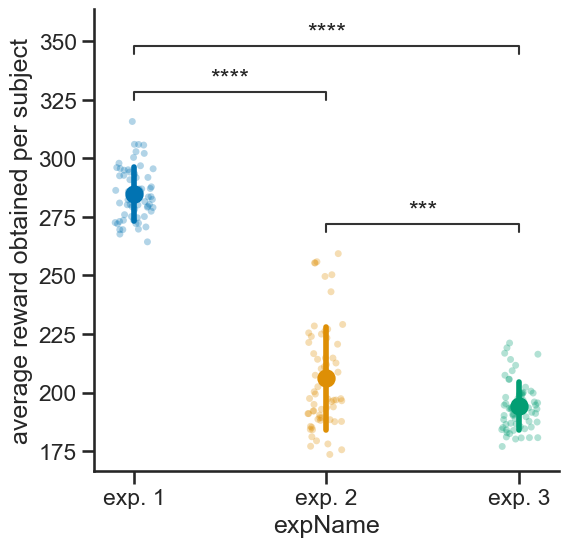

In [68]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.set({    "figure.figsize": (6, 6),}    )
sns.set_style("ticks")
sns.set_context("talk")
sns.set_palette("colorblind")

exps = df.expName.unique().tolist()
data = df.groupby(['expName', 'prolificID']).std(numeric_only=True).reset_index()
ax = sns.pointplot(x='expName', y='outcome', data=data, join=False, errorbar='sd',
              palette=['C0', 'C1', 'C2'])
sns.stripplot(x='expName', y='outcome', data=data, palette=['C0', 'C1', 'C2'], alpha=0.3, jitter=True, ax=ax)
# plt.ylim(100, 600)
sns.despine()
plt.xticks([0, 1, 2], ['exp. 1', 'exp. 2', 'exp. 3'])
plt.ylabel('average reward obtained per subject')
from statannotations.Annotator import Annotator
import itertools

# Create pairs of experiments for annotation
pairs = list(itertools.combinations(exps, 2))
annotator = Annotator(ax,  pairs, x='expName', y='outcome',
                     data=data, order=['FullPilot12', 'FullPilot13', 'FullPilot14'],)
annotator.configure(test='t-test_ind', text_format='star', loc='inside')
annotator.apply_and_annotate()

In [69]:
np.random.binomial(1, 0.88, size=1000).std()

0.31902194281898544

In [37]:
np.std(B)

0.3570714214271425

R1 (B * X):
  Mean: 610.21
  Std Dev: 256.93

R2 (0.12 * X):
  Mean: 644.96
  Std Dev: 257.25


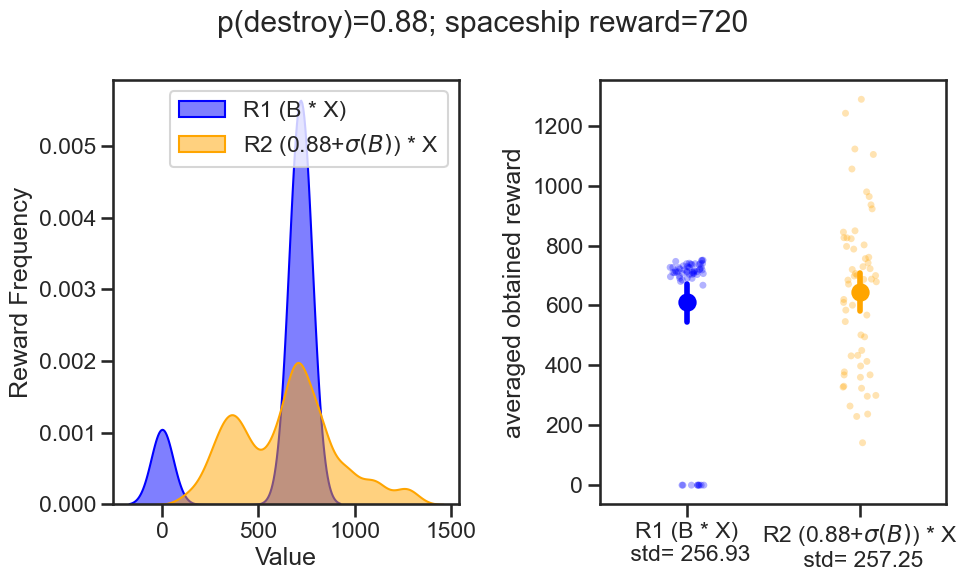

In [66]:
import numpy as np
import matplotlib.pyplot as plt

# Set seed for reproducibility
np.random.seed(42)

# Number of simulations
N = 60


# Generate samples
B = np.random.binomial(1, 0.88, size=N)
X = np.random.normal(loc=720, scale=20, size=N)

# Compute R1 and R2
R1 = B * X
R2 = 0.88 * X
# regenerate R2 but with same spread as R1, so using its std deviation to add or remove to 0.88
R2 = (0.88 + np.random.normal(0, np.std(B), size=N)) * X


# Compare distributions
print("R1 (B * X):")
print(f"  Mean: {np.mean(R1):.2f}")
print(f"  Std Dev: {np.std(R1):.2f}")

print("\nR2 (0.12 * X):")
print(f"  Mean: {np.mean(R2):.2f}")
print(f"  Std Dev: {np.std(R2):.2f}")

# Plot histograms
plt.figure(figsize=(10, 6))
plt.subplot(1, 2, 1)
sns.kdeplot(R1, color='blue', label='R1 (B * X)', fill=True, alpha=0.5, bw_adjust=0.5)
sns.kdeplot(R2, color='orange', label='R2 (0.88+$\\sigma(B)$) * X', fill=True, alpha=0.5, bw_adjust=0.5)
plt.legend()
plt.xlabel("Value")
plt.ylabel("Reward Frequency")
plt.subplot(1, 2, 2)
sns.pointplot(data=[R1, R2], palette=['blue', 'orange'])
sns.stripplot(data=[R1, R2], palette=['blue', 'orange'], alpha=0.3, jitter=True)
plt.xticks([0, 1], ['R1 (B * X)\n std= {:.2f}'.format(np.std(R1)), 'R2 (0.88+$\\sigma(B)$) * X\n std= {:.2f}'.format(np.std(R2))])
plt.ylabel("averaged obtained reward")

plt.suptitle("p(destroy)=0.88; spaceship reward=720")
plt.tight_layout()

R1 (B * X):
  Mean: 610.21
  Std Dev: 256.93

R2 (0.12 * X):
  Mean: 632.10
  Std Dev: 15.62


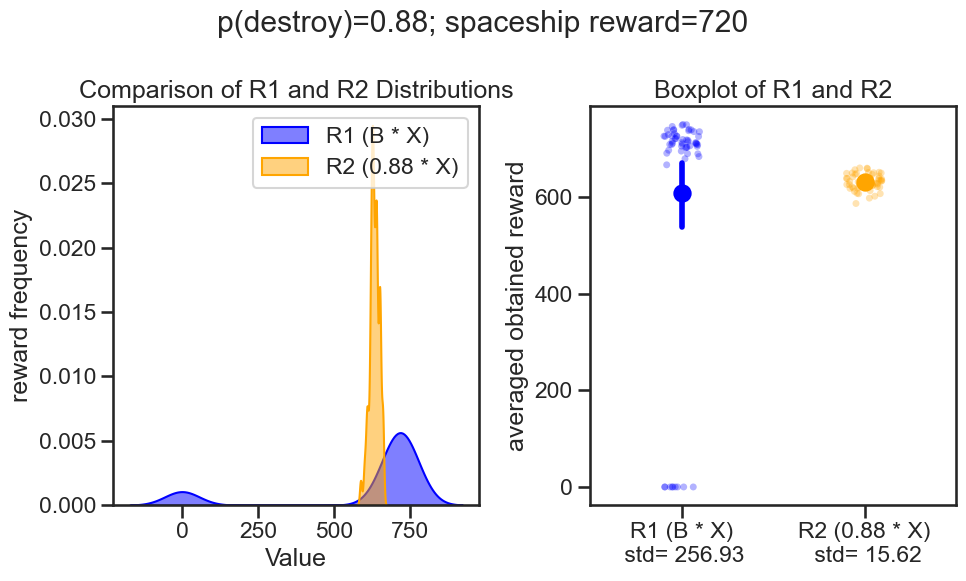

In [65]:
import numpy as np
import matplotlib.pyplot as plt

# Set seed for reproducibility
np.random.seed(42)

# Number of simulations
N = 60


# Generate samples
B = np.random.binomial(1, 0.88, size=N)
X = np.random.normal(loc=720, scale=20, size=N)

# Compute R1 and R2
R1 = B * X
R2 = 0.88 * X
# regenerate R2 but with same spread as R1, so using its std deviation to add or remove to 0.88
# R2 = (0.88 + np.random.normal(0, np.std(B), size=N)) * X


# Compare distributions
print("R1 (B * X):")
print(f"  Mean: {np.mean(R1):.2f}")
print(f"  Std Dev: {np.std(R1):.2f}")

print("\nR2 (0.12 * X):")
print(f"  Mean: {np.mean(R2):.2f}")
print(f"  Std Dev: {np.std(R2):.2f}")

# Plot histograms
plt.figure(figsize=(10, 6))
plt.subplot(1, 2, 1)
sns.kdeplot(R1, color='blue', label='R1 (B * X)', fill=True, alpha=0.5, bw_adjust=0.5)
sns.kdeplot(R2, color='orange', label='R2 (0.88 * X)', fill=True, alpha=0.5, bw_adjust=0.5)
plt.legend()
plt.xlabel("Value")
plt.ylabel("reward frequency")
plt.title("Comparison of R1 and R2 Distributions")
plt.subplot(1, 2, 2)
sns.pointplot(data=[R1, R2], palette=['blue', 'orange'])
sns.stripplot(data=[R1, R2], palette=['blue', 'orange'], alpha=0.3, jitter=True)
plt.xticks([0, 1], ['R1 (B * X)\n std= {:.2f}'.format(np.std(R1)), 'R2 (0.88 * X)\n std= {:.2f}'.format(np.std(R2))])
plt.ylabel("averaged obtained reward")
plt.title("Boxplot of R1 and R2")

plt.suptitle("p(destroy)=0.88; spaceship reward=720")
plt.tight_layout()

In [5]:
df[(df.expName == 'FullPilot14') & (df.session==3) & (df.choice==1)][['outcome', 'outcome1', 'choice', 'p1', 'm1', 'ev1', ]]

,outcome,outcome1,choice,p1,m1,ev1
96453,510,510,1,0.82,620,508
96454,745,745,1,1.00,720,720
96455,201,201,1,0.27,720,194
96457,730,730,1,1.00,720,720
96458,730,730,1,1.00,720,720
...,...,...,...,...,...,...
128889,130,130,1,0.38,380,144
128890,539,539,1,0.82,620,508
128891,542,542,1,0.88,620,546
128892,501,501,1,0.73,720,526


In [55]:
df[(df.session==3) & (df.m1 == 720) & (df.choice==1) & (df.pair.isin([0,1]))].groupby('expName').outcome1.max()

expName
FullPilot12    760
FullPilot13    760
FullPilot14    738
Name: outcome1, dtype: int64

<Axes: xlabel='expName', ylabel='outcome'>

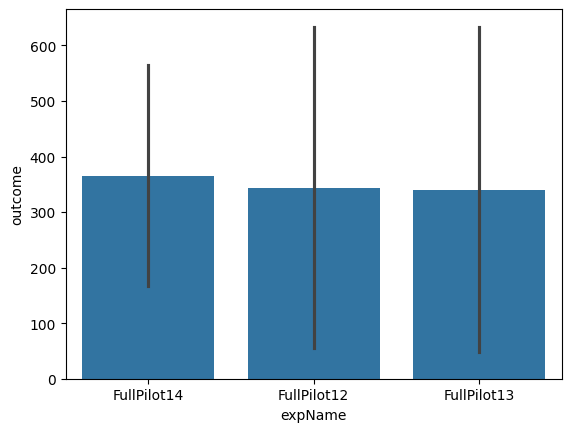

In [29]:
sns.barplot(
    data=df,
    x='expName',
    y='outcome',
    errorbar='sd',
)

<Axes: xlabel='chosen_p', ylabel='Density'>

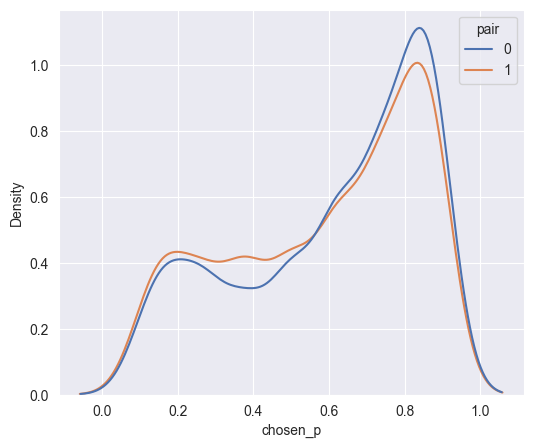

In [37]:
df2 = df[(df.expName== 'FullPilot12') & (df.session==3) & (df.pair.isin([0, 1, 2])) & (df.group=='combined')]
# df2 = df2.groupby(['pair', 'prolificID', 'chosen_m'], as_index=False).mean(numeric_only=True)

sns.set({'figure.figsize': (6, 5)})

sns.kdeplot(data=df2, x='chosen_p', hue='pair')


In [30]:

session = 3
df_ = df[(df.session==session)].groupby(['prolificID'], as_index=False).mean(numeric_only=True)

import scipy.stats as stats

df_['delta'] = df_.opti_ff - df_.opti_ss

df_['opti_ff'] = df_.opti_ff.astype(float)
df_['opti_ss'] = df_.opti_ss.astype(float)
df_['delta'] = df_.delta.astype(float)
df['opti_ff'] = df['opti_ff'].astype(float)
df['opti_ss'] = df['opti_ss'].astype(float)
         
df2 = df[(df.session==session) & (df.expName.isin(expName))]

def get_group2(row):
    opti_ff = df2[df2.prolificID==row.prolificID].opti_ff
    opti_ss = df2[df2.prolificID==row.prolificID].opti_ss
    ttest = stats.ttest_rel(opti_ff, opti_ss)
    p = ttest.pvalue
    t = ttest.statistic
    p_ss = stats.ttest_1samp(opti_ss, 0.5, alternative='greater').pvalue < 0.05 
    p_ff = stats.ttest_1samp(opti_ff, 0.5, alternative='greater').pvalue < 0.05

    if p > 0.05:
        if p_ss and p_ff:
            return 'balanced'
        if p_ss:
            return 'value'
        if p_ff:
            return 'perceptual'
        return 'random'
    
    if t > 0 and p_ff:
        return 'perceptual'
    if t < 0  and p_ss:
        return 'value'

    return 'random'

def get_group(row):
    opti_ff = df2[df2.prolificID==row.prolificID].opti_ff
    opti_ss = df2[df2.prolificID==row.prolificID].opti_ss
    p_ss = stats.ttest_1samp(opti_ss, 0.5, alternative='greater').pvalue < 0.05 
    p_ff = stats.ttest_1samp(opti_ff, 0.5, alternative='greater').pvalue < 0.05

    if p_ss and p_ff:
        return 'combined'
        
    
    if p_ff:
        return 'perceptual'
    if p_ss:
        return 'value'

    return 'random'
    # raise ValueError('unexpected value')

df_['group'] = df_.apply(get_group, axis=1)

df['group'] = df['prolificID'].map(df_.set_index('prolificID')['group'])

# df = df[df.group != 'random']
print(len(df.prolificID.unique()))

190


In [6]:
# map prolificID to unique integer id
df['prolificID'] = df['prolificID'].astype('category')
df['id'] = df['prolificID'].cat.codes



In [11]:
shield_above_chance
# spaceship_above_chance

array([173, 119, 167,  69,  35,  87, 160, 156,  94, 161,  75,  39, 174,
       185,  38, 170,  98, 163, 182, 159, 157, 125, 169, 187,  45, 144,
        43,  22, 145, 137,  51, 123,  71, 120, 122, 101, 110,   3,  19,
        42, 146,  44,  90,  91,  21,  31,  97,  89,   7,  84,  99,  95,
        41,  11,  68,   9,  92,   4,  59,  13,   0,   8, 143, 133, 108,
       147,  24,  47,  78,  57,  85, 153,  88,  86, 136], dtype=int16)

In [16]:
spaceship_above_chance = set([1, 2, 3, 4, 5, 6])  # Participants with above chance in spaceship task
shield_above_chance = set([4, 5, 6, 7, 8])  # Participants with above chance in shield task


spaceship_above_chance
# shield_above_chance

{1, 2, 3, 4, 5, 6}

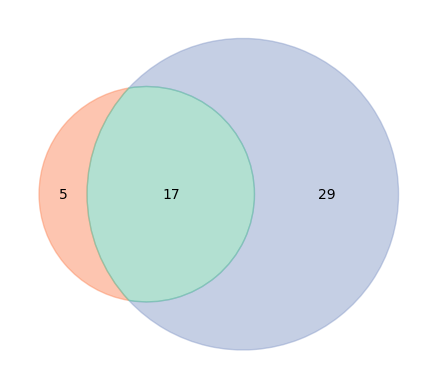

In [41]:
import matplotlib.pyplot as plt
from matplotlib_venn import venn2, venn2_circles
sns.set_palette("Set2")

df = df[df.expName=='FullPilot12']

# Define the sets for participants in each category (example values)
# You would replace these with your actual data
spaceship_above_chance = set(df[df.group=='value'].id.unique())  # Participants with above chance in spaceship task
shield_above_chance = set(df[df.group=='perceptual'].id.unique())  # Participants with above chance in shield task

# add combined group to spaceship_above_chance
spaceship_above_chance = spaceship_above_chance.union(set(df[df.group=='combined'].id.unique()))
shield_above_chance = shield_above_chance.union(set(df[df.group=='combined'].id.unique()))
# Create the Venn diagram
venn = venn2([spaceship_above_chance, shield_above_chance], set_labels=('', ''))

# Customize the diagram if needed (e.g., changing labels or colors)
venn_circles = venn2_circles([spaceship_above_chance, shield_above_chance], linestyle='solid', linewidth=1.5, color='none')
venn.get_patch_by_id('10').set_color('C1')  # Circle for Set 1
venn.get_patch_by_id('01').set_color('C2')  # Circle for Set 2
venn.get_patch_by_id('11').set_color('C0')  # Intersection
# Optional: Adjust transparency
venn.get_patch_by_id('10').set_alpha(0.5)
venn.get_patch_by_id('01').set_alpha(0.5)
venn.get_patch_by_id('11').set_alpha(0.5)
# Display the plot
# plt.title("Clustering of participants based on performance")
# plt.show()
# put background transparent
plt.gcf().patch.set_alpha(0.0)


In [50]:
df.group.unique()

array(['combined', 'random', 'perceptual', 'value'], dtype=object)

In [8]:
expName = ['FullPilot14']
session = 4
df__ = df[(df.session==session) & (df.expName.isin(expName))].groupby(['prolificID'], as_index=False).mean(numeric_only=True)

import scipy.stats as stats


         
df2 = df[(df.session==session) & (df.expName.isin(expName))]

def get_group2(row):
    opti_ff = df2[df2.prolificID==row.prolificID].opti_ff
    opti_ss = df2[df2.prolificID==row.prolificID].opti_ss
    ttest = stats.ttest_rel(opti_ff, opti_ss)
    p = ttest.pvalue
    t = ttest.statistic
    p_ss = stats.ttest_1samp(opti_ss, 0.5, alternative='greater').pvalue < 0.05 
    p_ff = stats.ttest_1samp(opti_ff, 0.5, alternative='greater').pvalue < 0.05

    if p > 0.05:
        if p_ss and p_ff:
            return 'balanced'
        if p_ss:
            return 'value'
        if p_ff:
            return 'perceptual'
        return 'random'
    
    if t > 0 and p_ff:
        return 'perceptual'
    if t < 0  and p_ss:
        return 'value'

    return 'random'

def get_group(row):
    opti_ff = df2[df2.prolificID==row.prolificID].opti_ff
    opti_ss = df2[df2.prolificID==row.prolificID].opti_ss
    p_ss = stats.ttest_1samp(opti_ss, 0.5, alternative='greater').pvalue < 0.05 
    p_ff = stats.ttest_1samp(opti_ff, 0.5, alternative='greater').pvalue < 0.05

    if p_ss and p_ff:
        return 'combined'
        
    
    if p_ff:
        return 'perceptual'
    if p_ss:
        return 'value'

    return 'random'
    # raise ValueError('unexpected value')
df__ = df_.copy()
df__['group'] = df__.apply(get_group, axis=1)


# df = df[df.group != 'random']
print(len(df.prolificID.unique()))

65


In [41]:
df.group.unique()

array(['random'], dtype=object)

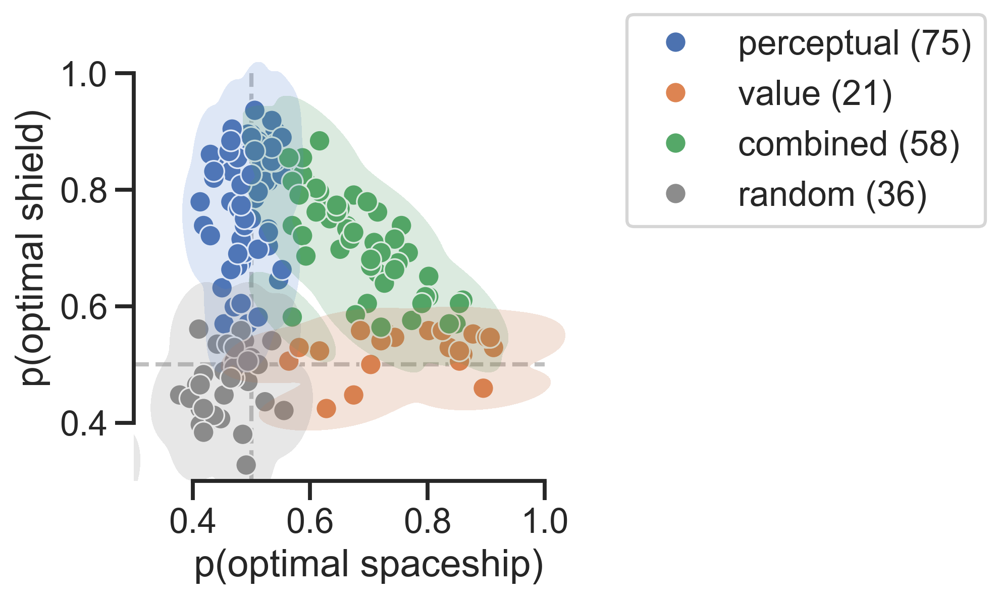

In [19]:
# same but with scatterplot

import matplotlib.pyplot as plt
from scipy.stats import multivariate_normal

df_ = df[(df.session==3)].groupby(['prolificID', 'group'], as_index=False).mean(numeric_only=True)
# df_ = df_[df_.group!='random']
sns.set(rc={'figure.figsize':(4,4), 'figure.dpi': 300})
sns.set_context("talk")
sns.set_style("ticks")


# sort by group 
order = ['perceptual', 'combined', 'value', 'random']
df_['group'] = pd.Categorical(df_['group'], categories=order, ordered=True)

# df_['opti_ss_training'] = df[(df.expName=='FullPilot14') & (df.session==2) & (df.group!='random')].groupby(['prolificID', 'group']).opti_ss.mean().values
# df_['opti_ff_training'] = df[(df.expName=='FullPilot14') & (df.session==1) & (df.group!='random')].groupby(['prolificID', 'group']).opti_ff.mean().values

scatter = sns.scatterplot(data=df_, x='opti_ss', y='opti_ff', hue='group', palette=['C0', 'C2', 'C1', 'C7'], s=100)


# using seaborn, we want a region of interest using the colors of the clusters in scatterplot
sns.kdeplot(data=df_, x='opti_ss', y='opti_ff', alpha=0.2, fill=True, palette=['C0', 'C2', 'C1', 'C7'], hue='group', levels=2, bw_adjust=0.6, thresh=0.001) 
# Draw kdeplot for clusters with sufficient points


            

# add a third dimension (opti_ev)
plt.ylim(0.3, 1.1)
plt.xlim(0.3, 1.1)

# add identity line (x=y)
# plt.plot([0.3, 1], [0.3, 1], color='grey', lw=2, zorder=-100, alpha=0.5)

# add 0.5 line v and h
# plt.axhline(0.5, color='grey', lw=2, ls='--', alpha=0.5, zorder=-100)
# plt.axvline(0.5, color='grey', lw=2, ls='--', alpha=0.5 , zorder=-100)

plt.plot([0, 1], [.5, .5], color='grey', lw=2, ls='--', alpha=0.5, zorder=-100)
plt.plot([.5, .5], [0, 1], color='grey', lw=2, ls='--', alpha=0.5, zorder=-100)

plt.xlabel('p(optimal spaceship)')
plt.ylabel('p(optimal shield)')
# put legend outside
# N = len(data)
# plt.title(f'counterfactual+R/2; N={N}')
sns.despine(trim=True)
#no legend
# plt.legend().remove()

#
# use order for legend
handles, labels = plt.gca().get_legend_handles_labels()
labels = ['perceptual', 'value', 'combined', 'random']
handles = [handles[order.index(label)] for label in labels]
labels = [f'{label} ({len(df_[df_.group==label])})' for label in labels]
plt.legend(title='', bbox_to_anchor=(1.05, 1), labels=labels, handles=handles,
           loc=2, borderaxespad=0.)

# legend order
# plt.legend().remove()

In [9]:
df.groupby('prolificID').group.first().value_counts(normalize=True) * 100

group
perceptual    39.473684
combined      30.526316
random        18.947368
value         11.052632
Name: proportion, dtype: float64

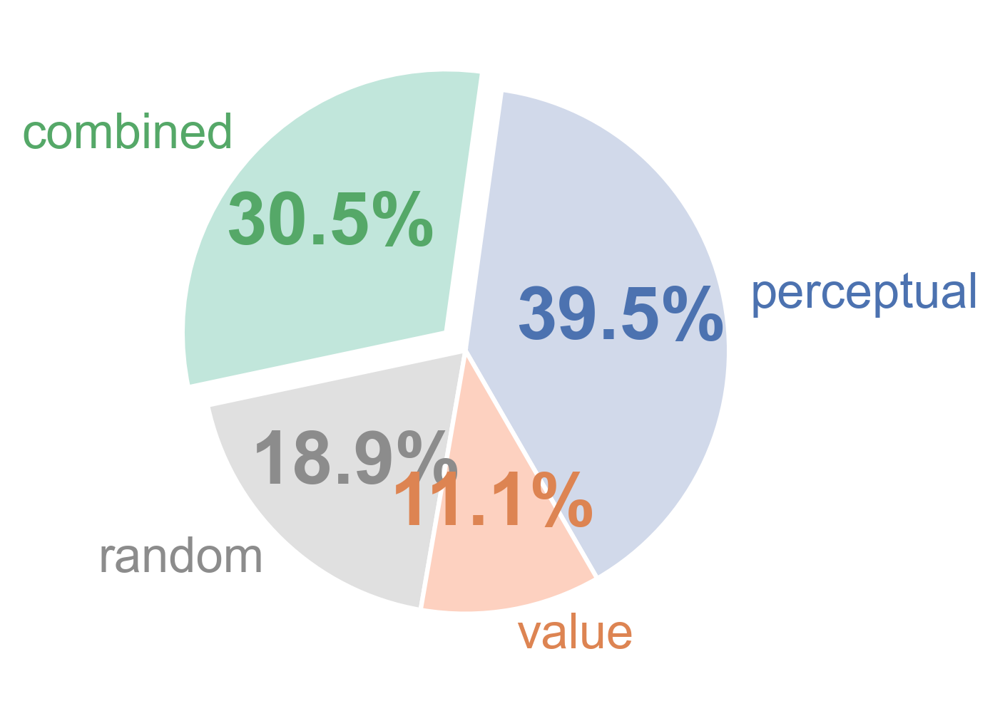

In [52]:
import seaborn as sns
import matplotlib.pyplot as plt

# Data
groups =  ['perceptual', 'combined', 'random', 'value']

means = df.groupby('prolificID').group.first().value_counts(normalize=True)
means = means.reindex(groups, fill_value=0)  # Ensures all groups exist in the expected order

# Explode Shoes slice
explode = [0., 0.1, 0, 0]

colors = ['C0', 'C2', 'C7', 'C1']
# colors with alpha = 0.5
colors2 = [(r, g, b, 0.4) for r, g, b in sns.color_palette('Set2')]
# select 0, 2, 7, 1
colors2 = [colors2[i] for i in [2, 0, 7, 1]]

# Create pie chart
wedges, texts, autotexts = plt.pie(means, labels=groups, explode=explode, colors=colors2, autopct='%1.1f%%', startangle=-60)

for i, autotext in enumerate(autotexts):
    autotext.set_color(colors[i])
    autotext.set_fontsize(25)
    autotext.set_fontweight('bold')

for i, text in enumerate(texts):
    text.set_color(colors[i])



In [9]:
df_ = df.copy()
for pid in df.prolificID.unique():
    # print(pid)
    # check len of the two samples
    a = len(df[(df.prolificID==pid) & (df.session==1)].opti_ff)
    b = len(df[(df.prolificID==pid) & (df.session==2)].opti_ff)
    if a != b:
        # find max len
        max_len = max(a, b)
        # if b is smaller fill with np.nan
        # else resize a to max_len
        # print if a or b if longer
        print(pid, a, b)
        continue

    df_.loc[(df_.prolificID==pid) & (df_.session==2), 'opti_ff'] = df[(df.prolificID==pid) & (df.session==1)].opti_ff.values

df2 = df_.copy()
df2 = df2[df2.session==2]
print(df2.opti_ff.isna().sum())
def get_group(prolificID):
    opti_ff = df2[df2.prolificID==prolificID].opti_ff
    opti_ss = df2[df2.prolificID==prolificID].opti_ss
    p_ss = stats.ttest_1samp(opti_ss, 0.5, alternative='greater').pvalue < 0.05 
    p_ff = stats.ttest_1samp(opti_ff, 0.5, alternative='greater').pvalue < 0.05

    if p_ss and p_ff:
        return 'combined'
          
    if p_ff:
        return 'perceptual'
    
    if p_ss:
        return 'value'

    return 'random'

for pid in df.prolificID.unique():
    df_.loc[df_.prolificID==pid, 'group'] = get_group(pid)


# now compare the groups in df and df_
x = []
y = []
z = []
for pid in df.prolificID.unique():
    group = df[df.prolificID==pid].group.values[0]
    group_ = df_[df_.prolificID==pid].group.values[0]
    group__ = df__[df__.prolificID==pid].group.values[0]
    x.append(group_)
    y.append(group)
    z.append(group__)
    # if group != group_:
        # print(pid)

# for each pair of groups, count the number of 


636590165e6fcc3e84ee2b6d 45 47
0


c:\Users\basil\.pyenv\pyenv-win\versions\3.9.12\lib\site-packages\scipy\stats\_axis_nan_policy.py:531: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  res = hypotest_fun_out(*samples, **kwds)


NameError: name 'df__' is not defined

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import sys
sys.path.append('..')

from src.visualization.pysankey2.pysankey2 import Sankey

colorDict = {
    'value': 'C1',
    'perceptual': 'C0',
    'random': 'gray',
    'combined': 'C2'
}

df_sankey = pd.DataFrame({'layer1': x, 'layer2': y, 'layer3': z})
order = np.array(['value', 'perceptual', 'combined', 'random'])[::-1]
# set stripColor="left" 
sky = Sankey(df_sankey,colorDict=colorDict,stripColor='left', layerLabels=
             {'layer1': order, 'layer2': order, 'layer3': order})

# set a bigger font size 
fig,ax = sky.plot()

plt.savefig('sankey.png', dpi=300)



NameError: name 'x' is not defined

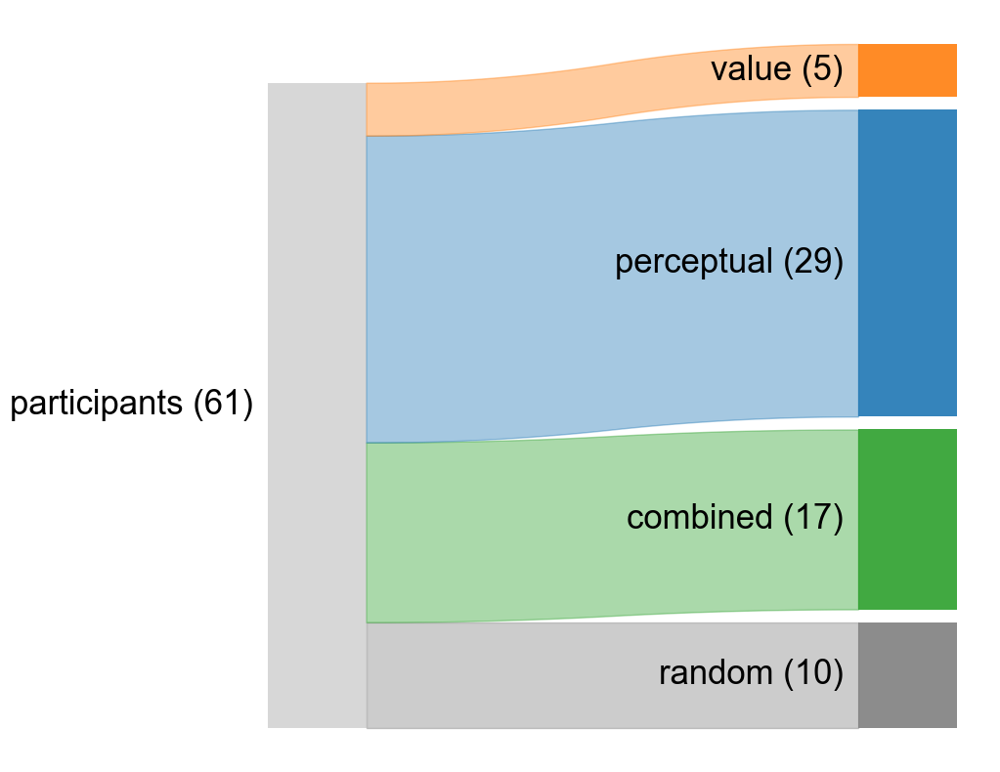

In [4]:
import matplotlib.pyplot as plt
import pandas as pd
import sys
sys.path.append('..')

from src.visualization.pysankey2.pysankey2 import Sankey

colorDict = {
    'participants': 'lightgray',
    'value': 'C1',
    'perceptual': 'C0',
    'random': 'gray',
    'combined': 'C2'
}
x = df[df.expName=='FullPilot12'].prolificID.nunique() * ['participants']
y = df[df.expName=='FullPilot12'].groupby('prolificID').group.first().values

# print(y)
df_sankey = pd.DataFrame({'layer1': x, 'layer2': y})
order = np.array(['value', 'perceptual', 'combined', 'random'])[::-1]
# set stripColor="left" 
sky = Sankey(df_sankey,colorDict=colorDict,stripColor='right', fontSize=25, layerLabels= {'layer1': ['participants'], 'layer2': order})

# set a bigger font size 
fig,ax = sky.plot()

# plt.savefig('sankey.png', dpi=300)



[0.12, 0.18, 0.27, 0.38, 0.5, 0.62, 0.73, 0.82, 0.88]


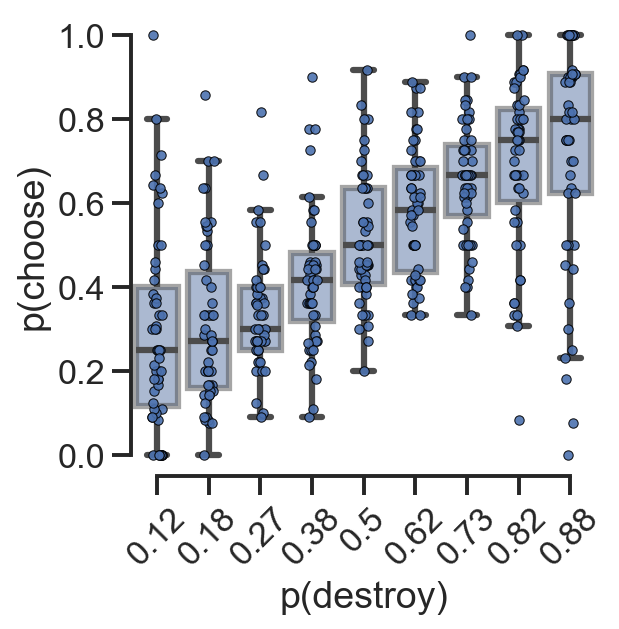

In [15]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# df = pd.read_csv('../data/raw/fullpilot10.csv')
dff = df[df.expName==expName]
dff = dff[df.session.isin([1])]
dff = dff[dff.group!='random']

dff['id'] = df.prolificID
# plot y as choice frequency for each p
# plot x as p
# plot size as N (number of trials with p)
pp = np.unique(np.array([dff.p1.unique(), dff.p2.unique()]).flatten())
# mm = np.unique(np.array([df.m1.unique(), df.m2.unique()]).flatten())
# print(pp)
logit = lambda x: 1/(1+np.exp(-2*x))
print(logit(np.linspace(-1, 1, 9)).round(2).tolist())
# assert sorted(pp) == logit(np.linspace(-1, 1, 9)).round(2).tolist()
p_freq = []
m_freq = []
for pid in dff.id.unique():
    ddf = dff[(dff.id == pid)]
    for p1 in pp:
        n_p1 = ((ddf.p1 == p1) | (ddf.p2 == p1)).sum()
        p_freq.append(
            {
             'id': pid,
             'p': p1,
             'choice_freq_p': ((ddf.p1 == p1) & (ddf.choice == 1) | (ddf.p2 == p1) & (ddf.choice == 2)).sum() / n_p1,
             'N_p': n_p1,
             'correct_p': ((ddf.p1 == p1) & (ddf.choice == 1)  & (ddf.p1 > ddf.p2) | (ddf.p2 == p1) & (ddf.choice == 2) & (ddf.p2 > ddf.p1)).sum() / n_p1,
            }
        )


p_freq = pd.DataFrame(p_freq)
m_freq = pd.DataFrame(m_freq)

# plt.figure(figsize=(5, 4), dpi=150)
sns.set(rc={'figure.figsize':(4, 4), 'figure.dpi':150})
# sns.set(rc={'figure.figsize':(3, 3), 'figure.dpi':150})
sns.set_style('ticks')
sns.set_context('talk')
sns.boxplot(x='p', y='choice_freq_p', data=p_freq, showfliers=False, boxprops=dict(alpha=0.5), zorder=-1, color='C0', linewidth=3)   

sns.stripplot(x='p', y='choice_freq_p',data=p_freq, alpha=0.9, size=4.5, zorder=1, edgecolor='black', linewidth=0.5, color="C0")

# plot identity line
# plt.plot([0, len(pp)], [0, 1], color='black', linestyle='--', zorder=-10, alpha=0.8)
sns.despine(trim=True)
plt.ylabel('p(choose)')
plt.xlabel('p(destroy)')
plt.tick_params(axis='x', rotation=45)
# slides.add('bw.pptx')
# plot text for N on top of bars


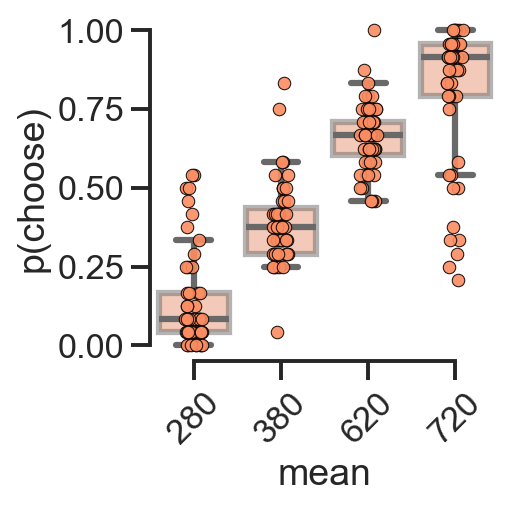

In [10]:
import matplotlib.pyplot as plt

session = [2]
df['id'] = df.prolificID
dff = df[df.expName==expName].copy()
# dff = dff[dff.t > 25]
dff = dff[dff.session.isin(session)]    
dff = dff[dff.group!='random']

mm = np.unique(np.array([dff.m1.unique(), dff.m2.unique()]).flatten())
p_freq = []
m_freq = []
for pid in dff.id.unique():
    ddf = dff[(dff.id == pid)]
    
    for m in mm:
        n_m = ((ddf.m1 == m) | (ddf.m2 == m)).sum()
        m_freq.append(
            {
              'id': pid,
             'm': m,
             'choice_freq_m': ((ddf.m1 == m) & (ddf.choice == 1) | (ddf.m2 == m) & (ddf.choice == 2)).sum() / n_m,
             'N_m': n_m,
             'correct_m': ((ddf.m1 == m) & (ddf.choice == 1)  & (ddf.m1 > ddf.m2) | (ddf.m2 == m) & (ddf.choice == 2) & (ddf.m2 > ddf.m1)).sum() / n_m,
            }
        ) 

p_freq = pd.DataFrame(p_freq)
m_freq = pd.DataFrame(m_freq)

# plt.figure(figsize=(5, 4), dpi=150)
sns.set(rc={'figure.figsize':(3, 3), 'figure.dpi':150})
sns.set_style('ticks')
sns.set_context('talk')
sns.set_palette('Set2')
sns.boxplot(x='m', y='choice_freq_m', data=m_freq, showfliers=False, color='C1', boxprops=dict(alpha=0.5), zorder=-1, linewidth=3)   

sns.stripplot(x='m', y='choice_freq_m',data=m_freq, alpha=0.9, size=6, zorder=1, edgecolor='black', linewidth=0.5, color="C1")

# plot identity line
# plt.plot([0, len(pp)], [0, 1], color='black', linestyle='--', zorder=-10, alpha=0.8)
sns.despine(trim=True)
plt.ylabel('p(choose)')
plt.xlabel('mean')
plt.tick_params(axis='x', rotation=45)
# slides.add('bw.pptx')

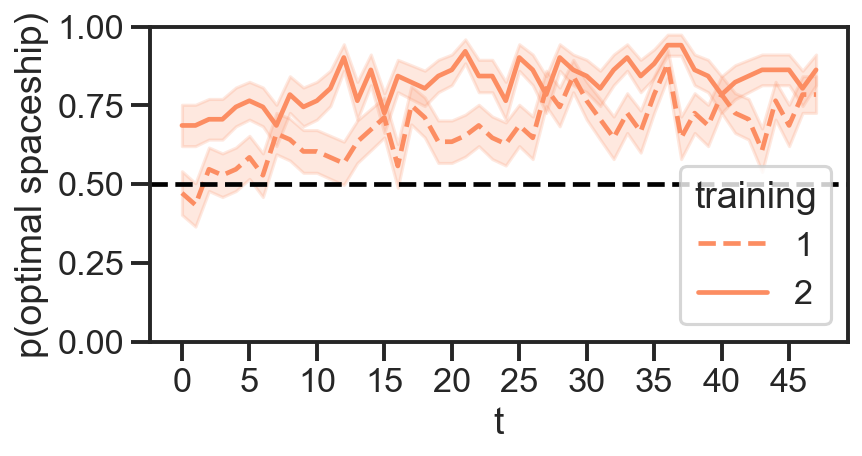

In [33]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

plt.subplot(2, 1, 1)
sns.lineplot(x='t', y='opti_ss', data=df[df.session.isin([0,2]) & (df.group!='random')], hue="session", errorbar=('se'), palette=['C1', 'C1'])

# Set linestyle on the first line to dashed
plt.gca().get_lines()[0].set_linestyle("--")

# Add horizontal reference line
plt.axhline(y=0.5, color='black', linestyle='--')
plt.ylabel('p(optimal spaceship)')

# Set x-axis ticks and y-axis limits
plt.xticks(np.arange(0, 48, 5))
plt.ylim(0,1)

# Manually create legend handles with correct linestyles
import matplotlib.lines as mlines

line1 = mlines.Line2D([], [], color='C1', linestyle='--', label='1')
line2 = mlines.Line2D([], [], color='C1', linestyle='-', label='2')

plt.legend(title='training', handles=[line1, line2], loc='lower right')


(0.0, 1.0)

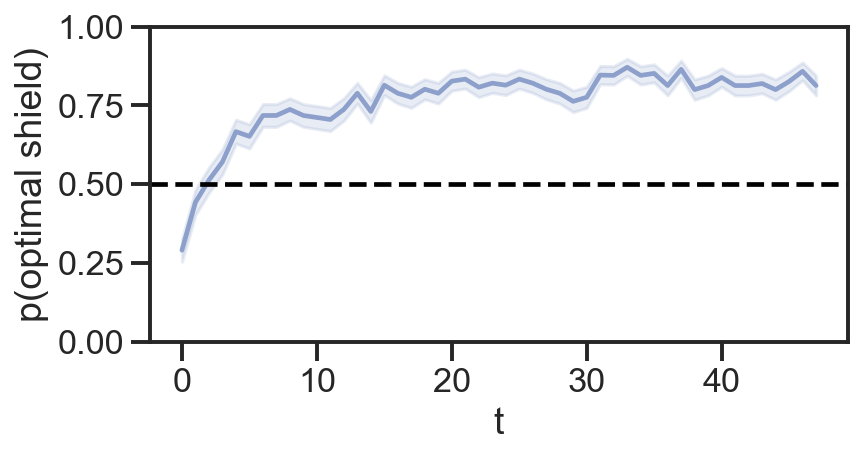

In [5]:
sns.set(rc={'figure.figsize':(6, 6), 'figure.dpi':150}) 
sns.set_palette('Set2')
sns.set_style('ticks') 
sns.set_context('talk')
plt.subplot(2, 1, 1)
ddf = df[df.group!='random']
sns.lineplot(x='t', y='opti_ff', data=df[(df.session==1) & (df.group!='random')], color='C2', errorbar=('se'))
plt.axhline(y=0.5, color='black', linestyle='--')
plt.ylabel('p(optimal shield)')
plt.ylim(0,1)


# now plot means for opti_ff


session
0    0.638552
1    0.681148
2    0.773406
Name: opti, dtype: float64


C:\Users\basil\AppData\Local\Temp\ipykernel_24616\3749307169.py:41: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(x='session', y='opti', data=ddf, showfliers=False, boxprops=dict(alpha=.5),  zorder=-1, linewidth=3, palette=['C1', 'C2', 'C1'], meanline=True)
C:\Users\basil\AppData\Local\Temp\ipykernel_24616\3749307169.py:44: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.stripplot(x='session', y='opti', data=ddf, alpha=0.9, size=8, zorder=1, edgecolor='black', linewidth=0.5, palette=['C1', 'C2', 'C1'])


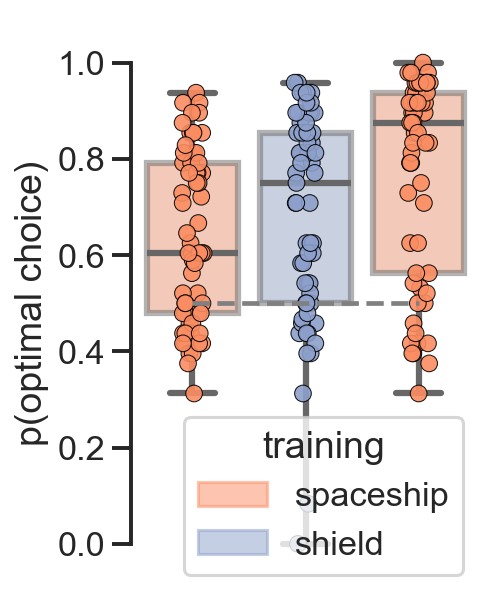

In [48]:
# compare opti_ss mean in session 2 to opti_ff_mean in session 2

sns.set(rc={'figure.figsize':(3, 5), 'figure.dpi':150})
sns.set_style('ticks')
sns.set_context('talk')
sns.set_palette('Set2')
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

ddf = df.copy()
# ddf = ddf[ddf.group!='random']
# ddf = ddf[ddf.t>23] 
ddf = ddf[ddf.session.isin([0,1, 2])]
ddf = ddf[ddf.expName.isin(['FullPilot12'])]

# ddf['exp'] = 1
# ddf['opti'] = np.nan
# ddf = ddf[ddf.group!='random']  
# create a new dataframe with id, opti_ss, opti_ff, session
ddf.loc[ddf.session.isin([0,2]), 'opti'] = ddf[ddf.session.isin([0,2])].opti_ss
ddf.loc[ddf.session == 1, 'opti'] = ddf[ddf.session == 1].opti_ff

# session 0 and 2 becomes session 0 with average of opti 0 and 2
# def average_opti(x):
    # for each t and prolificID, return the mean of opti
    # return np.mean(ddf[(ddf.session.isin([0, 2])) & (ddf.prolificID == x.prolificID) & (ddf.t == x.t)].opti)

# ddf['opti'] = ddf.apply(lambda x: average_opti(x) if x.session in [0, 1, 2] else x.opti, axis=1)

# now drop session 2
# ddf = ddf[ddf.session != 2]




ddf = ddf.groupby(['prolificID', 'session'], as_index=False).opti.mean()
# ddf = ddf[ddf.group!='random']
# ddf = ddf[ddf.t>28]
print(ddf.groupby('session').opti.mean())

ax = sns.boxplot(x='session', y='opti', data=ddf, showfliers=False, boxprops=dict(alpha=.5),  zorder=-1, linewidth=3, palette=['C1', 'C2', 'C1'], meanline=True)
# Apply alpha only to the fill (facecolor), keep edge opaque

sns.stripplot(x='session', y='opti', data=ddf, alpha=0.9, size=8, zorder=1, edgecolor='black', linewidth=0.5, palette=['C1', 'C2', 'C1'])

plt.ylabel('p(optimal choice)')
plt.plot([0, 2], [0.5, 0.5], color='grey', linestyle='--')
sns.despine(trim=True, bottom=True)
plt.ylim(0, 1)
plt.yticks(np.linspace(0, 1, 6))
plt.xlabel('')
plt.xticks([])
plt.ylim(-.1, 1.1)

# orange is "spaceship training"
# blue is "shield training"
# import patch
import matplotlib.patches as Patch
handles = [
   Patch.Patch(color='C1', label='spaceship', alpha=0.5),
    Patch.Patch(color='C2', label='shield', alpha=0.5),
]

plt.legend(title='training', handles=handles, loc='lower right')

In [29]:
print(labels)

[]


In [13]:
import pingouin as pg
pg.pairwise_ttests(data=ddf, dv='opti', between='session', parametric=True, padjust='bonf')

c:\Users\basil\.pyenv\pyenv-win\versions\3.9.12\lib\site-packages\pingouin\pairwise.py:28: UserWarning: pairwise_ttests is deprecated, use pairwise_tests instead.
  warnings.warn("pairwise_ttests is deprecated, use pairwise_tests instead.", UserWarning)


,Contrast,A,B,Paired,Parametric,T,dof,alternative,p-unc,p-corr,p-adjust,BF10,hedges
0,session,0,1,False,True,-1.179281,120.0,two-sided,0.240619,0.721858,bonf,0.362,-0.212197
1,session,0,2,False,True,-3.865600,120.0,two-sided,0.000180,0.000541,bonf,128.638,-0.695566
2,session,1,2,False,True,-2.380091,120.0,two-sided,0.018884,0.056651,bonf,2.42,-0.428267


In [71]:
df.groupby('group').prolificID.nunique()

group
combined      58
perceptual    75
random        36
value         21
Name: prolificID, dtype: int64

p-value annotation legend:
      ns: 5.00e-02 < p <= 1.00e+00
       *: 1.00e-02 < p <= 5.00e-02
      **: 1.00e-03 < p <= 1.00e-02
     ***: 1.00e-04 < p <= 1.00e-03
    ****: p <= 1.00e-04

value vs. combined: t-test independent samples, P_val:8.790e-02 t=1.729e+00
perceptual vs. value: t-test independent samples, P_val:1.628e-05 t=-4.546e+00
perceptual vs. combined: t-test independent samples, P_val:2.227e-05 t=-4.399e+00


C:\Users\garciaba\AppData\Local\Temp\ipykernel_3016\471753064.py:14: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(


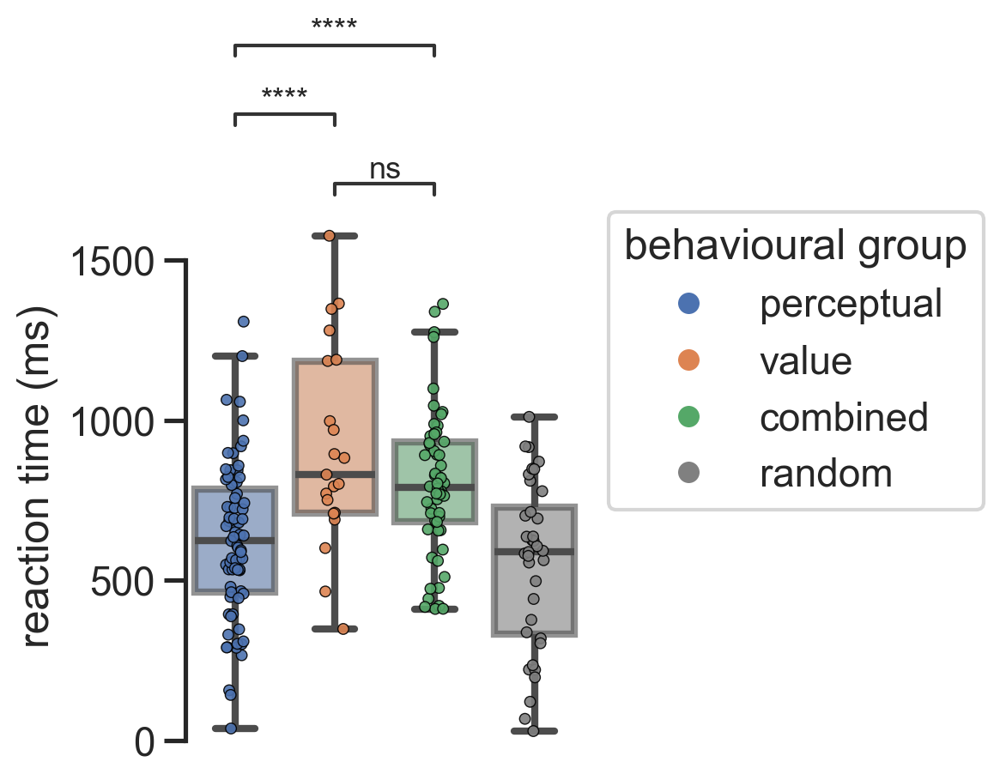

In [98]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming df is already defined

df_ = df.groupby(['prolificID', 'group'], as_index=False).mean(numeric_only=True)
order = ['perceptual', 'value', 'combined', 'random']
colors = ['C0', 'C1', 'C2', 'grey']
sns.set(rc={'figure.figsize':(3,4), 'figure.dpi': 200})
sns.set_context("talk")
sns.set_style("ticks")

# Create the boxplot without hue
ax = sns.boxplot(
    x='group', y='moveTime', data=df_, showfliers=False, boxprops=dict(alpha=0.6), zorder=-1, linewidth=3, palette=colors, order=order
)

# Create the stripplot with hue
stripplot = sns.stripplot(legend=False,
    hue='group', x='group', y='moveTime', data=df_, alpha=0.9, size=4.5, zorder=1, edgecolor='black', linewidth=0.5, order=order, palette=colors, hue_order=order
)


from matplotlib.lines import Line2D

# Manually create the legend using Line2D
legend_elements = [
    Line2D([0], [0], marker='o', color='w', markerfacecolor=colors[0], markersize=10, label='perceptual'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor=colors[1], markersize=10, label='value'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor=colors[2], markersize=10, label='combined'),
    Line2D([0], [0], marker='o', color='w', markerfacecolor=colors[3], markersize=10, label='random')
]

# Add the custom legend to the plot
plt.legend(handles=legend_elements, loc='upper right', bbox_to_anchor=(2, 1), borderaxespad=0., title='behavioural group')

import itertools
pairs = list(itertools.combinations(order, 2))
pairs = [('value', 'combined'), ('value', 'perceptual'), ('perceptual', 'combined')]
from statannotations.Annotator import Annotator
annotator = Annotator(ax, pairs, data=df_ , x='group', y='moveTime', order=order, loc='outside')
annotator.configure(test='t-test_ind', text_format='star', loc='outside', text_offset=0.01, fontsize=13)
annotator.apply_and_annotate()

plt.ylabel('reaction time (ms)')
plt.xlabel('')
plt.xticks([])
plt.ylim(0, 1650)
sns.despine(trim=True, bottom=True)

In [ ]:
df.grou

C:\Users\garciaba\AppData\Local\Temp\ipykernel_3016\2069657621.py:13: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.boxplot(
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


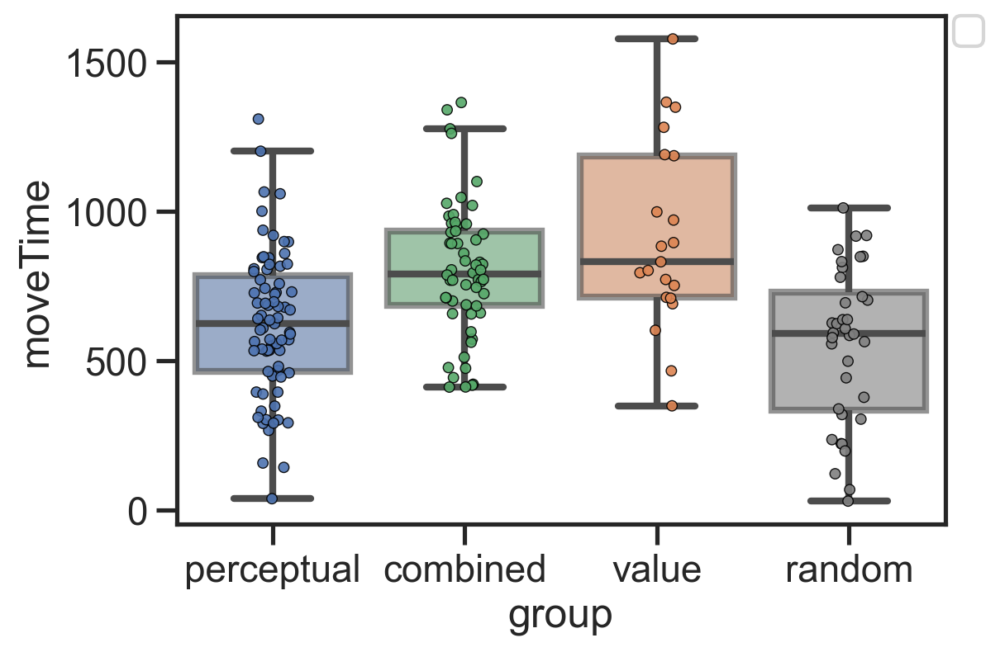

In [59]:
import matplotlib.pyplot as plt
import seaborn as sns

# Assuming df is already defined
df_ = df.groupby(['prolificID', 'group']).mean(numeric_only=True)
order = ['perceptual', 'combined', 'value', 'random']
colors = ['C0', 'C2', 'C1', 'grey']
sns.set(rc={'figure.figsize':(6,4), 'figure.dpi': 200})
sns.set_context("talk")
sns.set_style("ticks")

# Create the boxplot without hue
ax = sns.boxplot(
    x='group', y='moveTime', data=df_, showfliers=False, boxprops=dict(alpha=0.6), zorder=-1, linewidth=3, palette=colors, order=order
)

# Create the stripplot with hue
stripplot = sns.stripplot(
    hue='group', x='group', y='moveTime', data=df_, alpha=0.9, size=4.5, zorder=1, edgecolor='black', linewidth=0.5, order=order, palette=colors, hue_order=order
)

# Manually create the legend
handles, labels = stripplot.get_legend_handles_labels()
plt.legend(title='', labels=['perceptual', 'combined', 'value', 'random'], handles=handles[:4], loc='upper right', bbox_to_anchor=(1.05, 1), borderaxespad=0.)

plt.show()

perceptual 22
combined 14
value 13
random 15
['perceptual', 'combined', 'value', 'random']
['C0', 'C2', 'C1', 'C7']


C:\Users\basil\AppData\Local\Temp\ipykernel_16028\3528365788.py:30: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_, x='group', y='moveTime', palette=colors, order=order)
C:\Users\basil\AppData\Local\Temp\ipykernel_16028\3528365788.py:39: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(data=df_, x='group', y='fireTime', palette=colors, order=order)


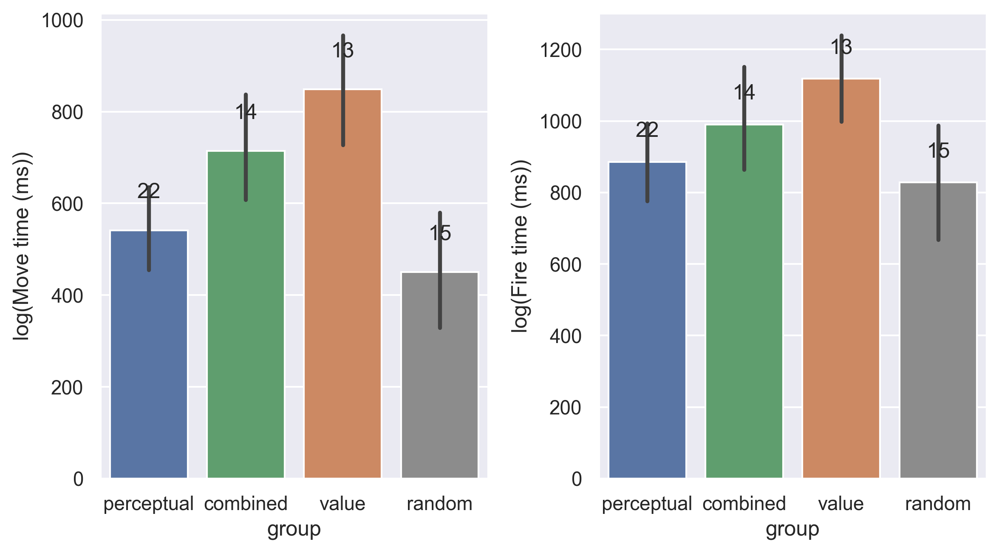

In [16]:
# plot reaction times for each group
#fireTime
sns.set(rc={'figure.figsize':(8,4.5)})
import matplotlib.pyplot as plt

expName = ['FullPilot14']
# df_ = df[(df.expName=='FullPilot9') & (df.start_with_rl==0) & (df.session==2)]
df_ = df[(df.expName.isin(expName)) & (df.session==3)]
# df_['fireTime'] = np.log(df_['fireTime'])
# df_['moveTime'] = np.log(df_['moveTime'])
df_ = df.groupby(['prolificID', 'group'], as_index=False).mean(numeric_only=True)
# df_ = df[]
order_ = ['perceptual', 'combined', 'value', 'random']
colors_ = ['C0', 'C2', 'C1', 'C7']
order = []
colors = []
# if some group have no participant, pop it from order
for i, o in enumerate(order_):
    N = df_[df_.group==o].shape[0]
    print(o, N)
    # print(o, N)
    if N != 0:
        order.append(o)
        colors.append(colors_[i])

print(order)
print(colors)

plt.subplot(1, 2, 1)
sns.barplot(data=df_, x='group', y='moveTime', palette=colors, order=order)
# plot each N for each bar

for i, bar in enumerate(plt.gca().patches):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 70, df_[df_.group==order[i]].shape[0], ha='center')
# sns.stripplot(data=df, x='group', y='moveTime', palette=['C0', 'C1', 'C2'], alpha=.5)
plt.ylabel('log(Move time (ms))')
# plt.ylim(0, 2000)
plt.subplot(1, 2, 2)
sns.barplot(data=df_, x='group', y='fireTime', palette=colors, order=order)
for i, bar in enumerate(plt.gca().patches):
    plt.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 70, df_[df_.group==order[i]].shape[0], ha='center')
plt.ylabel('log(Fire time (ms))')

# plt.ylim(0, 2000)
# plt.suptitle('current', fontsize=20)
plt.tight_layout()

c:\Users\basil\.pyenv\pyenv-win\versions\3.9.12\lib\site-packages\seaborn\categorical.py:3399: UserWarning: 7.8% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
c:\Users\basil\.pyenv\pyenv-win\versions\3.9.12\lib\site-packages\seaborn\categorical.py:3399: UserWarning: 19.6% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)


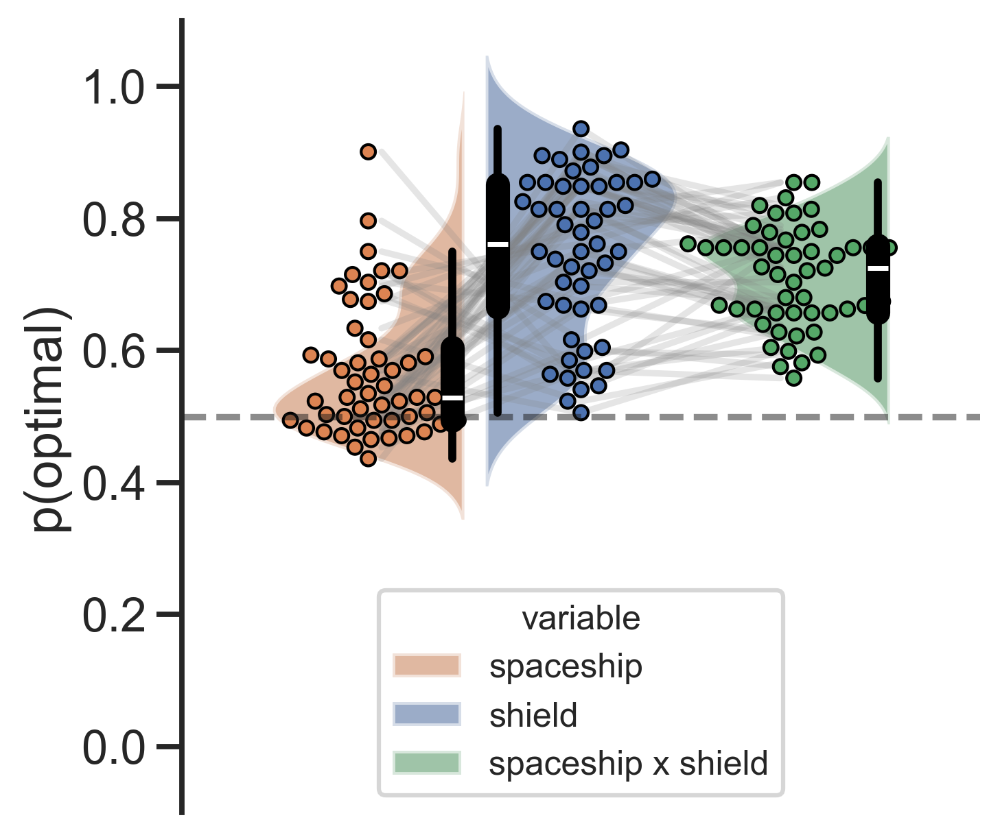

In [24]:
sns.set(rc={'figure.figsize':(5, 5), 'figure.dpi':300})
# set all fonts bigger
sns.set_context('talk')
sns.set_style('ticks')
import matplotlib.pyplot as plt
# sns.set_style('dark')
# plt.style.use('dark_background')
# sns.set_palette('dark')
# sns.set_theme(style='dark')



def plot(y='value', df=None):
    sns.violinplot(y=y, x='expName', hue='y', zorder=0, data=df, alpha=.6, linecolor='w', gap=.1, split=True, 
                     inner_kws={'color': 'black', 'linewidth': 0.5}, palette=['C1', 'C0', 'C2'])
    sns.swarmplot(y=y, x='expName', hue='y', zorder=1,
                    data=df,dodge=True, edgecolor='black', linewidth=1, palette=['C1', 'C0', 'C2'])
    # connect swarm dots with grey lines
    xlim = plt.xlim()
    trace_lines_between_dots(df, y=y)
    # sns.lineplot(y=y, 
                #  x='expName', hue='pair2', zorder=2, style='pair2', 
                #    data=df_, alpha=1, color='grey', units='prolificID', estimator=None, legend=False
                #    )
    plt.xlim(xlim)
    plt.ylim(-.1, 1.1)
    # sns.pointplot(y=y, x='expName', hue='pair2', zorder=2, data=df_, dodge=True, ci=None, estimator=np.mean, markers='o', scale=1.5)
    
    
# trace grey lines between hue categories swarm dots
# to do that we need to get the x position of each prolificID in the swarmplot
# and then draw a line between each pair of dots
def trace_lines_between_dots(df=None, y='opti_ss'):
    for j, expname in enumerate(np.sort(df.expName.unique())):
        for i, name in enumerate(df_[df_.expName==expname].prolificID.unique()):
            d1 = df[(df.prolificID==name) & (df.expName==expname) & (df.y=='opti_ss')]['value']
            assert len(d1) == 1
            d2 = df[(df.prolificID==name) & (df.expName==expname) & (df.y=='opti_ff')]['value']
            assert len(d2) == 1
            d3 = df[(df.prolificID==name) & (df.expName==expname) & (df.y=='opti_ev')]['value']
            y2 = d2.values[0]
            y1 = d1.values[0]
            y3 = d3.values[0]
            plt.plot([j-.25, j, j+.25], [y1, y2, y3], 'grey', alpha=.2, zorder=0)

df_ = df[df.session.isin([3])]
df_ = df_[df_.group!='random']
df_ = df_[df_.expName=='FullPilot12']
df_['expName'] = df_.session - 2
# df_['expName'] = df_.session.map({3: 'session 3', 4: 'session 4'})
# df_ = df[(df.session.isin([2])) & (df.expName.isin(exp)) & (df.start_with_rl==0)]
df_ = df_[df_.choice != 0]
df_ = df_.groupby(['session', 'prolificID'], as_index=False).mean(numeric_only=True)
# df_ = df_[df_.prolificID!='654cebe5afd0bb3557331628']
# df_ = df_[df_.expName.isin(exp)]
# rename expName to 1, 2, 3
# df_.loc[df_.expName=='FullPilot8', 'expName'] = 1
# df_.loc[df_.expName=='FullPilot9', 'expName'] = 2
# create a new df with col y= opti_ss, opti_ff, opti_ev, expName='FullPilot6.1', 'FullPilot7', value=mean(y)
df_ = pd.melt(df_, id_vars=['prolificID', 'expName'], value_vars=['opti_ss', 'opti_ff', 'opti_ev'], var_name='y', value_name='value')

# plt.subplot(1, 3, 1)

plt.plot([-0.5, len(df.session.unique())+.5], [0.5, 0.5], 'k--', alpha=0.5) 
plot(y='value', df=df_)
plt.ylabel('p(optimal)')
sns.despine()
plt.xlabel('')
plt.xticks([])
#45 degree xticks
# plt.xticks(rotation=45)
# plt.legend([],[], frameon=False)
# only keep first two legend handles
handles = plt.gca().get_legend_handles_labels()[0]
plt.legend(handles[0:3], ['spaceship', 'shield', 'spaceship x shield'], title='variable', loc='lower center', fontsize=12, title_fontsize=12)
# handle size

plt.tick_params(axis='x', length=0)
sns.despine(bottom=True)
# plt.xticks([0, 1], ['session 1', 'session 2'])

In [6]:
import scipy.stats as stats
df_ = df[df.session==3]
# paired t-test between opti_ss and opti_ff
stats.ttest_rel(df_.groupby('prolificID').opti_ff.mean(), df_.groupby('prolificID').opti_ss.mean())

TtestResult(statistic=0.7647087049533404, pvalue=0.44730005148772556, df=63)

Text(0.5, 1.0, 'Y Value by X and Hue')

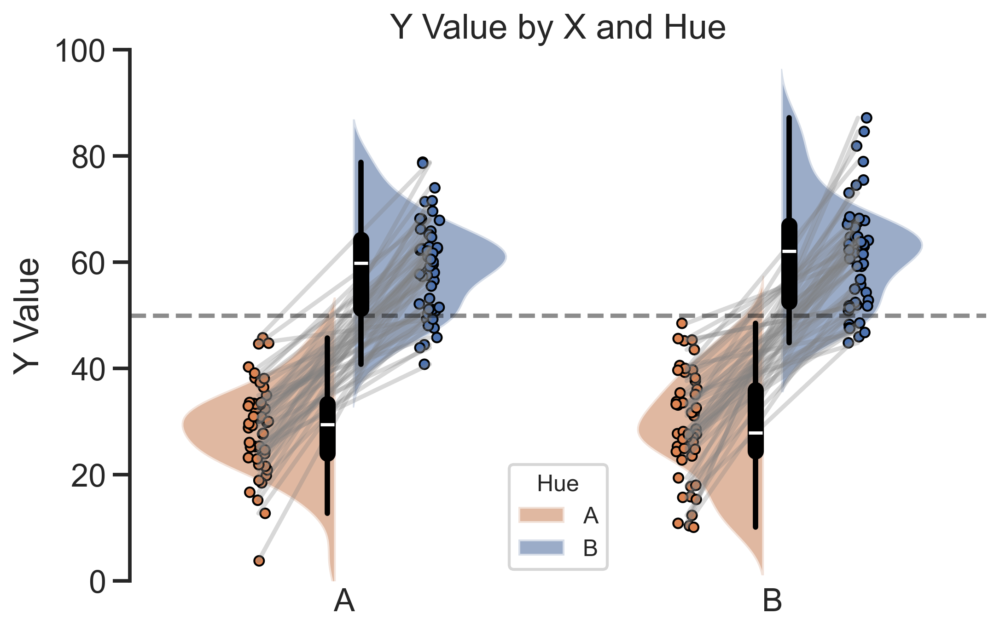

In [81]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

# Set up the plot style
sns.set(rc={'figure.figsize': (8, 5), 'figure.dpi': 300})
sns.set_context('talk')
sns.set_style('ticks')

def trace_lines_between_dots(df, x, hue, id_var, y):
    for j, x_val in enumerate(np.sort(df[x].unique())):
        for i, subject in enumerate(df[df[x] == x_val][id_var].unique()):
            d1 = df[(df[id_var] == subject) & (df[x] == x_val) & (df[hue] == df[hue].unique()[0])][y]
            d2 = df[(df[id_var] == subject) & (df[x] == x_val) & (df[hue] == df[hue].unique()[1])][y]
            if len(d1) == 1 and len(d2) == 1:
                y1 = d1.values[0]
                y2 = d2.values[0]
                plt.plot([j - .2, j + .2], [y1, y2], 'grey', alpha=.3, zorder=1)

# Create a synthetic dataset with Gaussian distributions and fixed differences
np.random.seed(42)
n_subjects = 100
mean_diff = 30  # Fixed difference between the two hues
data = {
    'subject_id': np.tile(np.arange(n_subjects), 2),
    'hue': np.repeat(['A', 'B'], n_subjects),
    'x': np.tile(['A', 'B'], n_subjects),
    'y': np.concatenate([
        np.random.normal(30, 10, n_subjects),  # Mean 30, std 10 for H1
        np.random.normal(30, 10, n_subjects) + mean_diff  # Mean 60, std 10 for H2
    ])
}
df = pd.DataFrame(data)

# Melt the DataFrame for visualization
df_melted = pd.melt(df, id_vars=['subject_id', 'x', 'hue'], value_vars=['y'], var_name='y_var', value_name='value')

# Select the columns for the plot
x = 'x'
hue = 'hue'
y = 'value'

# Create the plot
plt.figure()
plt.plot([-0.5, 1.5], [50, 50], 'k--', alpha=0.5)
sns.violinplot(y=y, x=x, hue=hue, zorder=0, data=df_melted, alpha=.6, linecolor='w', gap=.1, split=True, 
              palette=['C1', 'C0'], inner_kws={'color': 'black', 'linewidth': 0.5}, inner='box')
sns.stripplot(y=y, x=x, hue=hue, zorder=1, jitter=.05, data=df_melted, dodge=True, edgecolor='black', linewidth=1, palette=['C1', 'C0'])
xlim = plt.xlim()
trace_lines_between_dots(df_melted, x=x, hue=hue, id_var='subject_id', y=y)
plt.xlim(xlim)
plt.ylim(0, 100)
plt.ylabel('Y Value')
sns.despine()
plt.xlabel('')
handles, labels = plt.gca().get_legend_handles_labels()
plt.legend(handles[0:2], labels, title='Hue', loc='lower center', fontsize=12, title_fontsize=12)
plt.tick_params(axis='x', length=0)
sns.despine(bottom=True)
plt.title('Y Value by X and Hue')


In [35]:

tips

,total_bill,tip,sex,smoker,day,time,size,subject_id
0,16.99,1.01,Female,No,Sun,Dinner,2,7
1,10.34,1.66,Male,No,Sun,Dinner,3,20
2,21.01,3.50,Male,No,Sun,Dinner,3,29
3,23.68,3.31,Male,No,Sun,Dinner,2,15
4,24.59,3.61,Female,No,Sun,Dinner,4,11
...,...,...,...,...,...,...,...,...
239,29.03,5.92,Male,No,Sat,Dinner,3,24
240,27.18,2.00,Female,Yes,Sat,Dinner,2,15
241,22.67,2.00,Male,Yes,Sat,Dinner,2,27
242,17.82,1.75,Male,No,Sat,Dinner,2,22


C:\Users\basil\AppData\Local\Temp\ipykernel_12392\3040074614.py:9: UserWarning: The palette list has more values (3) than needed (2), which may not be intended.
  sns.violinplot(y=y, x='session', hue='y', zorder=0, data=df, alpha=.6, linecolor='w', gap=.1, split=True,
C:\Users\basil\AppData\Local\Temp\ipykernel_12392\3040074614.py:11: UserWarning: The palette list has more values (3) than needed (2), which may not be intended.
  sns.swarmplot(y=y, x='session', hue='y', zorder=1,
c:\Users\basil\.pyenv\pyenv-win\versions\3.9.12\lib\site-packages\seaborn\categorical.py:3399: UserWarning: 23.4% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
c:\Users\basil\.pyenv\pyenv-win\versions\3.9.12\lib\site-packages\seaborn\categorical.py:3399: UserWarning: 27.3% of the points cannot be placed; you may want to decrease the size of the markers or use stripplot.
  warnings.warn(msg, UserWarning)
c:\Users\basil\.pyenv\

([<matplotlib.axis.XTick at 0x23140e60c70>,
 [Text(0, 0, 'session 1'), Text(1, 0, 'session 2')])

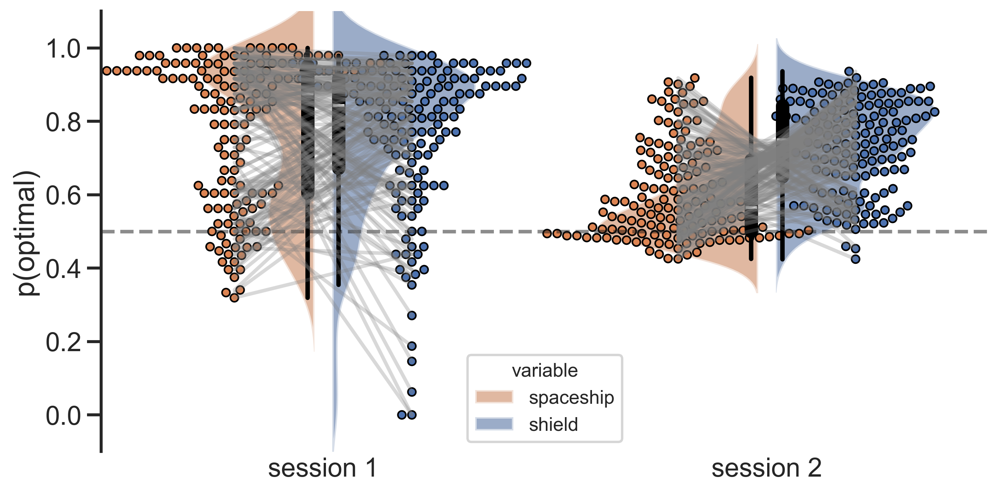

In [29]:
sns.set(rc={'figure.figsize':(10, 5), 'figure.dpi':300})
# set all fonts bigger
sns.set_context('talk')
sns.set_style('ticks')
import matplotlib.pyplot as plt


def plot(y='value', df=None):
    sns.violinplot(y=y, x='session', hue='y', zorder=0, data=df, alpha=.6, linecolor='w', gap=.1, split=True, 
                     inner_kws={'color': 'black', 'linewidth': 0.5}, palette=['C1', 'C0', 'C2'])
    sns.swarmplot(y=y, x='session', hue='y', zorder=1,
                    data=df,dodge=True, edgecolor='black', linewidth=1, palette=['C1', 'C0', 'C2'])
    xlim = plt.xlim()
    trace_lines_between_dots(df, y=y)

    plt.xlim(xlim)
    plt.ylim(-.1, 1.1)

    
    
# trace grey lines between hue categories swarm dots
# to do that we need to get the x position of each prolificID in the swarmplot
# and then draw a line between each pair of dots
def trace_lines_between_dots(df=None, y='opti_ss'):
    for j, expname in enumerate(np.sort(df.session.unique())):
        for i, name in enumerate(df_[df_.session==expname].prolificID.unique()):
            d1 = df[(df.prolificID==name) & (df.session==expname) & (df.y=='opti_ss')]['value']
            d2 = df[(df.prolificID==name) & (df.session==expname) & (df.y=='opti_ff')]['value']
            y2 = d2.values[0]
            y1 = d1.values[0]
            plt.plot([j-.2, j+.2], [y1, y2], 'grey', alpha=.3)

df_ = df[df.session.isin([1, 2, 3])]

df_ = df_[df_.group!='random']

df_ = df_[df_.choice != 0]
df_ = df_.groupby(['session', 'prolificID'], as_index=False).mean(numeric_only=True)

df_.loc[(df_.session==2), 'opti_ff'] = df_.loc[(df_.session==1)].opti_ff.values
df_ = df_[df_.session!=1]
df_ = pd.melt(df_, id_vars=['session', 'prolificID'], value_vars=['opti_ss', 'opti_ff'], var_name='y', value_name='value')

plt.plot([-0.5, len(df.session.unique())+.5], [0.5, 0.5], 'k--', alpha=0.5) 
plot(y='value', df=df_)
plt.ylabel('p(optimal)')
sns.despine()
plt.xlabel('')
plt.xticks([])
#45 degree xticks
# plt.xticks(rotation=45)
# plt.legend([],[], frameon=False)
# only keep first two legend handles
handles = plt.gca().get_legend_handles_labels()[0]
plt.legend(handles[0:3], ['spaceship', 'shield'], title='variable', loc='lower center', fontsize=12, title_fontsize=12)
# handle size

plt.tick_params(axis='x', length=0)
sns.despine(bottom=True)
plt.xticks([0, 1], ['session 1', 'session 2'])

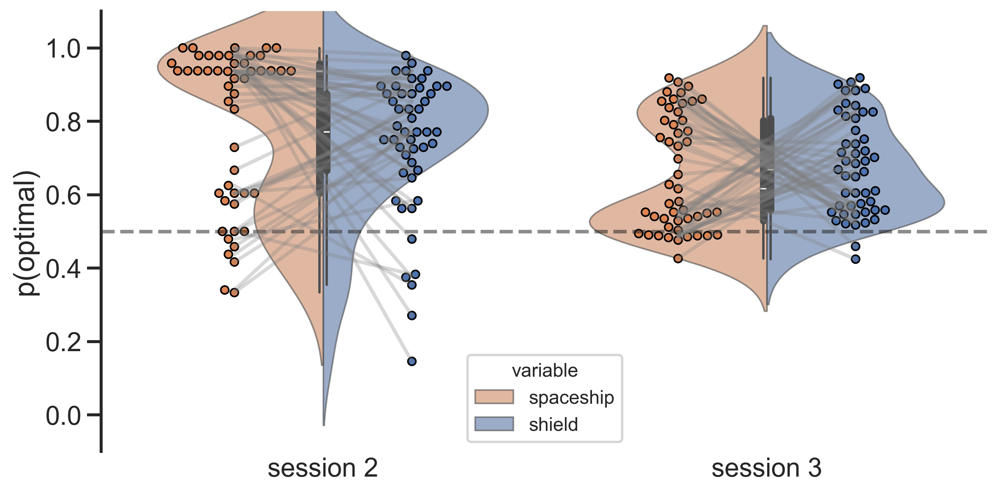

In [495]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Set plot styles
sns.set(rc={'figure.figsize': (10, 5), 'figure.dpi': 300})
sns.set_context('talk')
sns.set_style('ticks')

# Adjusted plot function
def plot(y='value', df=None):
    sns.violinplot(
        y=y, x='session', hue='y', zorder=0, data=df,
        alpha=.6, linewidth=1, split=True, 
         palette=['C1', 'C0']
    )
    sns.swarmplot(
        y=y, x='session', hue='y', zorder=1,
        data=df, dodge=True, edgecolor='black', linewidth=1, palette=['C1', 'C0']
    )
    xlim = plt.xlim()
    trace_lines_between_dots(df, y=y)
    plt.xlim(xlim)
    plt.ylim(-.1, 1.1)

# Function to trace grey lines between swarm dots
def trace_lines_between_dots(df=None, y='value'):
    for j, session in enumerate(np.sort(df.session.unique())):
        for i, pid in enumerate(df[df.session == session].prolificID.unique()):
            d1 = df[(df.prolificID == pid) & (df.session == session) & (df.y == 'opti_ss')]['value']
            d2 = df[(df.prolificID == pid) & (df.session == session) & (df.y == 'opti_ff')]['value']
            if not d1.empty and not d2.empty:
                plt.plot([j - 0.2, j + 0.2], [d1.values[0], d2.values[0]], 'grey', alpha=0.3)

df_ = df[df.session.isin([1, 2, 3])]
df_ = df_[df_.group!='random']
df_ = df_[df_.choice != 0]
df_ = df_.groupby(['session', 'prolificID'], as_index=False).mean(numeric_only=True)
df_.loc[(df_.session==2), 'opti_ff'] = df_.loc[(df_.session==1)].opti_ff.values
df_ = df_[df_.session!=1]

df_ = pd.melt(
    df_, id_vars=['session', 'prolificID'], value_vars=['opti_ss', 'opti_ff'],
    var_name='y', value_name='value'
)

# Plotting
plt.figure()
plt.plot([-0.5, len(df_.session.unique()) + 0.5], [0.5, 0.5], 'k--', alpha=0.5)
plot(y='value', df=df_)
plt.ylabel('p(optimal)')
sns.despine()
plt.xlabel('')
plt.xticks([0, 1], ['session 2', 'session 3'])

# Adjust legend
handles, labels = plt.gca().get_legend_handles_labels()
plt.legend(handles[:2], ['spaceship', 'shield'], title='variable', loc='lower center', fontsize=12, title_fontsize=12)
plt.tick_params(axis='x', length=0)
sns.despine(bottom=True)
plt.show()


# df_ = pd.melt(df_, id_vars=['session', 'prolificID'], value_vars=['opti_ss', 'opti_ff'], var_name='y', value_name='value')


In [ ]:
# count number of trials per session in FullPilot6
df[df.expName == 'FullPilot6'].groupby('session').t.nunique()
# in session 1 identify pairs (name 1, name 2) and compute average outcome (outcome 1, outcome 2)
df[(df.expName == 'FullPilot6') & (df.session == 1)].groupby(['name1']).outcome1.mean()

name1
FFEnemyShipNocolors1    62.708333
FFEnemyShipNocolors3    70.638889
Name: outcome1, dtype: float64

In [ ]:
df.loc[(df.expName == 'FullPilot6.1') & (df.session == 1) & (df.name2=='FFEnemyShipNoColors12'), 'pair'] = 0
df.loc[(df.expName == 'FullPilot6.1') & (df.session == 1) & (df.name2!='FFEnemyShipNoColors12'), 'pair'] = 1

df.loc[(df.expName == 'FullPilot6.1') & (df.session == 1) & (df.pair==0), 'm1'] = 62
df.loc[(df.expName == 'FullPilot6.1') & (df.session == 1) & (df.pair==0), 'm2'] = 38
df.loc[(df.expName == 'FullPilot6.1') & (df.session == 1) & (df.pair==1), 'm1'] = 72
df.loc[(df.expName == 'FullPilot6.1') & (df.session == 1) & (df.pair==1), 'm2'] = 28

# now recompute ev1 and ev2 by multiplying m1 and m2 by p1 and p2
df['ev1'] = df.m1 * df.p1
df['ev2'] = df.m2 * df.p2

# Check overall stats

In [ ]:
print('number of trials=', df.shape[0])
print('overall outcome mean=', pd.concat((df.outcome1, df.outcome2)).mean())
print('overall theoretical mean=', pd.concat((df.m1, df.m2)).mean())
print('overall p mean=', pd.concat((df.p1, df.p2)).mean())
print('outcome1 mean=', df.outcome1.mean())
print('outcome2 mean=', df.outcome2.mean())
print('p1 mean=', df.p1.mean())
print('p2 mean=', df.p2.mean())
print('p1 std=', df.p1.std())
print('p2 std=', df.p2.std())

# compute observed mean for each spaceship
names = pd.concat([df.name1, df.name2]).unique()
names

number of trials= 1728
overall outcome mean= 50.30555555555556
overall theoretical mean= 50.0
overall p mean= 0.5833333333333334
outcome1 mean= 62.536458333333336
outcome2 mean= 38.07465277777778
p1 mean= 0.5833333333333334
p2 mean= 0.5833333333333334
p1 std= 0.30486501137263305
p2 std= 0.30486501137263305


array(['FFEnemyNeutral', 'FFEnemyShipNocolors5', 'FFEnemyShipNocolors8',
       'FFEnemyShipNocolors3', 'FFEnemyShipNoColors11',
       'FFEnemyShipNoColors9', 'FFEnemyShipNocolors2',
       'FFEnemyShipNoColors12', 'FFEnemyShipNocolors6',
       'FFEnemyShipNocolors7', 'FFEnemyShipNocolors1'], dtype=object)

In [ ]:
# compute STD rewards for each expName
for exp in df.expName.unique():
    print(exp, df[(df.expName==exp) & (df.session.isin([1]))].outcome2.std())

FullPilot 18.603439051822996
FullPilot2 18.78485790646308
FullPilot3 10.517116715109028
FullPilot4 5.126841986386545
FullPilot5 10.717873399201743


# Check Means

In [ ]:
# compute observed mean for each spaceship
names = pd.concat([df.name1, df.name2]).unique()

for name in names:
    print(name)
    observed_mean1 = np.round(df[(df.name1==name) & (df.destroyed==1)].outcome1.mean(), 2)
    observed_mean2 = np.round(df[(df.name2==name) & (df.destroyed==1)].outcome2.mean(), 2)
    if not np.isnan(observed_mean1):
        print('observed mean 1=', observed_mean1, 'true mean=', df[df.name1==name].m1.mean())
    if not np.isnan(observed_mean2):
        print('observed mean 2=', observed_mean2, 'true mean=', df[df.name2==name].m2.mean())

FFEnemyNeutral
observed mean 1= 50.0 true mean= 50.0
observed mean 2= 50.0 true mean= 50.0
FFEnemyShipNocolors5
observed mean 1= 66.07 true mean= 67.0
observed mean 2= 35.03 true mean= 33.0
FFEnemyShipNocolors8
observed mean 1= 69.62 true mean= 72.0
observed mean 2= 30.34 true mean= 28.0
FFEnemyShipNocolors3
observed mean 1= 62.03 true mean= 62.0
FFEnemyShipNoColors11
observed mean 1= 63.24 true mean= 62.0
observed mean 2= 36.05 true mean= 38.0
FFEnemyShipNoColors9
observed mean 1= 66.92 true mean= 72.0
observed mean 2= 34.61 true mean= 28.0
FFEnemyShipNocolors2
observed mean 1= 63.52 true mean= 67.0
observed mean 2= 36.51 true mean= 33.0
FFEnemyShipNoColors12
observed mean 1= 66.98 true mean= 72.0
observed mean 2= 29.83 true mean= 28.0
FFEnemyShipNocolors6
observed mean 1= 62.36 true mean= 62.0
observed mean 2= 38.03 true mean= 38.0
FFEnemyShipNocolors7
observed mean 1= 68.75 true mean= 72.0
observed mean 2= 31.57 true mean= 28.0
FFEnemyShipNocolors1
observed mean 2= 42.31 true mean= 

([<matplotlib.axis.YTick at 0x1b1d436e580>,
 [Text(0, 0.0, '0.0'),
  Text(0, 0.1, '0.1'),
  Text(0, 0.2, '0.2'),
  Text(0, 0.30000000000000004, '0.3'),
  Text(0, 0.4, '0.4'),
  Text(0, 0.5, '0.5'),
  Text(0, 0.6000000000000001, '0.6'),
  Text(0, 0.7000000000000001, '0.7'),
  Text(0, 0.8, '0.8'),
  Text(0, 0.9, '0.9'),
  Text(0, 1.0, '1.0')])

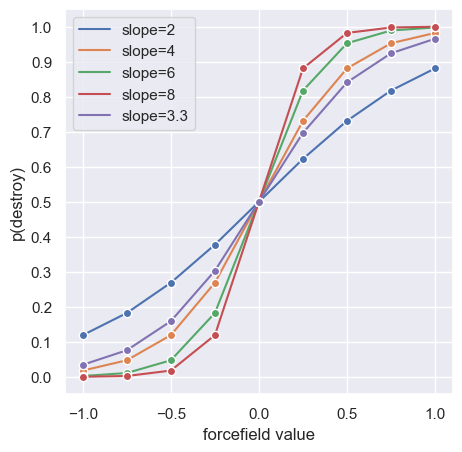

In [ ]:
x1 = np.linspace(-1, 1, 9)
slope1 = -2
x2= np.linspace(-1, 1, 9)
slope2 = -4
x3 = np.linspace(-1, 1, 9)
slope3 = -6
x4 = np.linspace(-1, 1, 9)
slope4 = -8
x5 = np.linspace(-1, 1, 9)
slope5 = -3.33

logistic = lambda x, slope: 1 / (1 + np.exp(slope*x))

sns.set({'figure.figsize': (5, 5), 'figure.dpi': 100})
sns.scatterplot(x=x1, y=logistic(x1, slope1), color='C0', edgecolor='white', lw=1, zorder=10)
sns.scatterplot(x=x2, y=logistic(x2, slope2), color='C1', edgecolor='white', lw=1, zorder=10)
sns.scatterplot(x=x3, y=logistic(x3, slope3), color='C2', edgecolor='white', lw=1, zorder=10)
sns.scatterplot(x=x4, y=logistic(x4, slope4), color='C3', edgecolor='white', lw=1, zorder=10)
sns.scatterplot(x=x5, y=logistic(x5, slope5), color='C4', edgecolor='white', lw=1, zorder=10)

sns.lineplot(x=x1, y=logistic(x1, slope1), color='C0', markers=True, dashes=False, label='slope=2')
sns.lineplot(x=x2, y=logistic(x2, slope2), color='C1', markers=True, dashes=False, label='slope=4')
sns.lineplot(x=x3, y=logistic(x3, slope3), color='C2', markers=True, dashes=False, label='slope=6')
sns.lineplot(x=x4, y=logistic(x4, slope4), color='C3', markers=True, dashes=False, label='slope=8')
sns.lineplot(x=x5, y=logistic(x5, slope5), color='C4', markers=True, dashes=False, label='slope=3.3')
plt.xlim(-1.1, 1.1)
plt.xlabel('forcefield value')
plt.ylabel('p(destroy)')

# yticks should be .1, .2, .3, .4, .5, .6, .7, .8, .9
plt.yticks(np.arange(0, 1.1, .1))

In [ ]:
exp = 'FullPilot5'
session = 2

df_ = df[(df.expName == exp) & (df.session == session)]

for p1 in df_.p1.unique():
    print(p1, df_[(df_.p1 == p1) & (df_.choice == 1)].destroyed.mean())

0.27 0.44
0.38 0.5
0.73 0.8157894736842105
0.5 0.45714285714285713
0.12 0.047619047619047616
0.18 0.21739130434782608
0.88 0.84375
0.62 0.5862068965517241
0.82 0.8780487804878049


In [ ]:
df.datetime

20191    2024-04-29 16:15:53
20192    2024-04-29 16:15:57
20193    2024-04-29 16:16:01
20194    2024-04-29 16:16:04
20195    2024-04-29 16:16:07
                ...         
57852    2024-06-05 15:51:06
57853    2024-06-05 15:51:11
57854    2024-06-05 15:51:15
57855    2024-06-05 15:51:19
57856    2024-06-05 15:51:24
Name: datetime, Length: 34597, dtype: object

In [ ]:
#sum outcomes

for pid in df.prolificID[df.datetime.str.contains('2024-05-30')].unique():
    obtained = df[(df.prolificID==pid) & (df.destroyed==1) & (df.choice==1)].outcome1.sum() + df[(df.prolificID==pid) &(df.destroyed==1) & (df.choice==2)].outcome2.sum()
    obtained = np.round(obtained* 0.00028, 2)
    print(f'{pid},{obtained}')


576ad50bc8a90000010d99c8,3.63
5c95493ddd325800166f838a,4.61
655f95ffd90905e27c938a49,3.9
6630f8c1f995b01de9767c7d,4.42
61230b14a3bcb65c585dfdaa,4.71
655f98627ee2491a2184c294,4.31
65dcca0d187f1e33aa00fca1,4.36
6574a4e29c6576b736f0388b,4.38
6117be8d81c34e0b13821371,4.88
62ceba5fdab49dfc90278cbb,4.0


In [ ]:
df[df.session.isin([2])].m1.unique()

array([72, 62], dtype=int64)

In [ ]:
# for each p compute the probability of destroying the spaceship
pp = pd.concat([df.p1, df.p2]).unique()
for p in sorted(pp):
    print(p)
    # print('p1=', p, 'p2=', 1-p)
    # get all instances of p1 and p2 = p
    all = df[((df.p1==p) & (df.choice==1)) | ((df.p2==p) & (df.choice==2))]
    print('observed mean=', all.destroyed.mean())
    # compute the probability of destroying the spaceship


0.12
observed mean= 0.12737127371273713
0.18
observed mean= 0.1655011655011655
0.27
observed mean= 0.2616033755274262
0.38
observed mean= 0.355877616747182
0.5
observed mean= 0.4993646759847522
0.62
observed mean= 0.624332977588047
0.73
observed mean= 0.7373646209386282
0.82
observed mean= 0.8207792207792208
0.88
observed mean= 0.8802122820318423
1.0
observed mean= 1.0


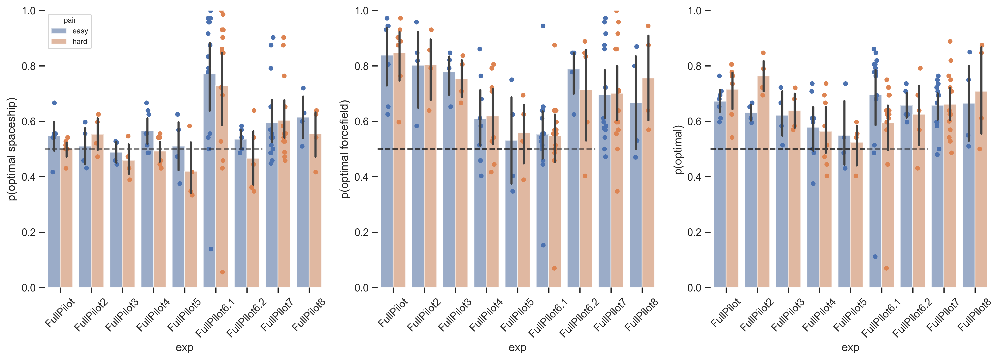

In [ ]:
df['opti_ss'] = df.choice==1 # ((df.m1 > df.m2) & (df.choice==1)) | ((df.m1 < df.m2) & (df.choice==2))
df['opti_ff'] = ((df.p1 > df.p2) & (df.choice==1)) | ((df.p1 < df.p2) & (df.choice==2))
df['opti_ev'] = ((df.ev1 > df.ev2) & (df.choice==1)) | ((df.ev1 < df.ev2) & (df.choice==2))
import matplotlib.pyplot as plt
df['pair2'] = df.pair.apply(lambda x: 'hard'  if x == 0 else 'easy')

sns.set(rc={'figure.figsize':(15, 5.5), 'figure.dpi':300})
sns.set_style('ticks')
# sns.set_style('dark')
# plt.style.use('dark_background')
# sns.set_palette('dark')
# sns.set_theme(style='dark')



df_ = df[df.session.isin([2])]

exp = ['FullPilot1', 'FullPilot2', 'FullPilot3', 'FullPilot4', 'FullPilot5', 'FullPilot6']

df_ = df_.groupby(['expName', 'prolificID', 'pair2'], as_index=False).mean(numeric_only=True)
df_ = df_[df_.prolificID!='654cebe5afd0bb3557331628']

plt.subplot(1, 3, 1)

plt.plot([-0.5, len(exp)+.5], [0.5, 0.5], 'k--', alpha=0.5) 
sns.barplot(y='opti_ss', x='expName', hue='pair2', alpha=0.6, zorder=0,
            data=df_)
sns.stripplot(y='opti_ss', x='expName', hue='pair2', zorder=1,
              data=df_,dodge=True)
plt.ylim(0, 1)
plt.ylabel('p(optimal spaceship)')
sns.despine()
plt.xlabel('exp')
#45 degree xticks
plt.xticks(rotation=45)
# plt.legend([],[], frameon=False)
# only keep first two legend handles
handles, labels = plt.gca().get_legend_handles_labels()
plt.legend(handles[0:2], labels[0:2], title='pair', loc='upper left', fontsize=8, title_fontsize=8
           )

plt.subplot(1, 3, 2)

plt.plot([-0.5, 4.5], [0.5, 0.5], 'k--', alpha=0.5) 
plt.plot([-0.5, len(exp)+.5], [0.5, 0.5], 'k--', alpha=0.5) 
sns.barplot(y='opti_ff', x='expName', hue='pair2', alpha=0.6, zorder=0,
            data=df_)
sns.stripplot(y='opti_ff', x='expName', hue='pair2', zorder=1,
                data=df_, dodge=True)

sns.despine()
plt.xlabel('exp')
plt.ylabel('p(optimal forcefield)')
plt.ylim(0, 1)
plt.legend([],[], frameon=False)
plt.tight_layout()

plt.xticks(rotation=45)
plt.subplot(1, 3, 3)

plt.plot([-0.5, 4.5], [0.5, 0.5], 'k--', alpha=0.5) 
plt.plot([-0.5, len(exp)+.5], [0.5, 0.5], 'k--', alpha=0.5) 
sns.barplot(y='opti_ev', x='expName', hue='pair2', alpha=0.6, zorder=0,
            data=df_)
sns.stripplot(y='opti_ev', x='expName', hue='pair2', zorder=1,
                data=df_, dodge=True)
#remove legend
plt.legend([],[], frameon=False)
sns.despine()
plt.xlabel('exp')
plt.ylabel('p(optimal)')
plt.ylim(0, 1)
plt.tight_layout()
plt.xticks(rotation=45)

sns.despine(bottom=True, left=True)


Text(-0.4, -0.2, '3 = counterfactual + reward/2')

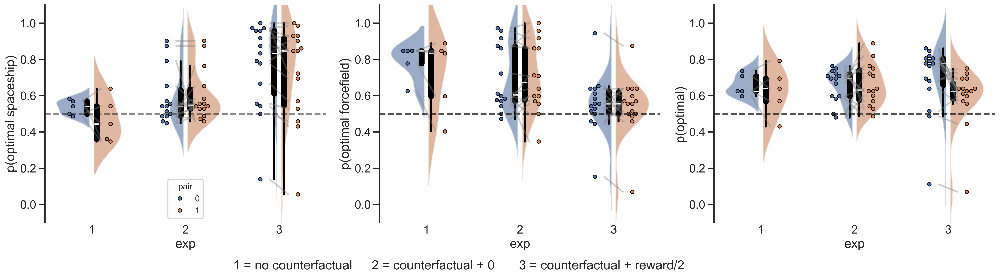

In [ ]:
df['opti_ss'] = ((df.m1 > df.m2) & (df.choice==1)) | ((df.m1 < df.m2) & (df.choice==2))
df['opti_ff'] = ((df.p1 > df.p2) & (df.choice==1)) | ((df.p1 < df.p2) & (df.choice==2))
df['opti_ev'] = ((df.ev1 > df.ev2) & (df.choice==1)) | ((df.ev1 < df.ev2) & (df.choice==2))
df.loc[df.datetime.str.contains('2024-05-22') & (df.expName=='FullPilot6'), 'expName'] = 'FullPilot6.1'
df.loc[df.expName=='FullPilot6', 'expName'] = 'FullPilot6.2'
import matplotlib.pyplot as plt
df['pair2'] = df.pair.apply(lambda x: 'hard'  if x == 0 else 'easy')

sns.set(rc={'figure.figsize':(20, 5.5), 'figure.dpi':300})
# set all fonts bigger
sns.set_context('talk')
sns.set_style('ticks')
# sns.set_style('dark')
# plt.style.use('dark_background')
# sns.set_palette('dark')
# sns.set_theme(style='dark')

def plot(y='opti_ss', df=None):
    sns.violinplot(y=y, x='expName', hue='pair2', zorder=0, data=df, alpha=.6, linecolor='w', gap=.1, split=True,
                     inner_kws={'color': 'black', 'linewidth': 0.5})
    sns.swarmplot(y=y, x='expName', hue='pair2', zorder=1,
                    data=df,dodge=True, edgecolor='black', linewidth=1)
    # connect swarm dots with grey lines
    xlim = plt.xlim()
    trace_lines_between_dots(df, y=y)
    # sns.lineplot(y=y, 
                #  x='expName', hue='pair2', zorder=2, style='pair2', 
                #    data=df_, alpha=1, color='grey', units='prolificID', estimator=None, legend=False
                #    )
    plt.xlim(xlim)
    plt.ylim(-.1, 1.1)
    # sns.pointplot(y=y, x='expName', hue='pair2', zorder=2, data=df_, dodge=True, ci=None, estimator=np.mean, markers='o', scale=1.5)
    
    
# trace grey lines between hue categories swarm dots
# to do that we need to get the x position of each prolificID in the swarmplot
# and then draw a line between each pair of dots
def trace_lines_between_dots(df=None, y='opti_ss'):
    for j, expname in enumerate(np.sort(df.expName.unique())):
        for i, name in enumerate(df[df.expName==expname].prolificID.unique()):
            y2 = df[(df.prolificID==name) & (df.pair2=='hard') & (df.expName==expname)][y].values[0]
            y1 = df[(df.prolificID==name) & (df.pair2=='easy') & (df.expName==expname)][y].values[0]
            plt.plot([j-.1, j+.1], [y1, y2], 'grey', alpha=.4)


df_ = df[df.session.isin([2])]

exp = ['FullPilot6.2', 'FullPilot6.1', 'FullPilot7']

df_ = df_.groupby(['expName', 'prolificID', 'pair2'], as_index=False).mean(numeric_only=True)
# df_ = df_[df_.prolificID!='654cebe5afd0bb3557331628']
df_ = df_[df_.expName.isin(exp)]
df_.loc[df_.expName=='FullPilot6.2', 'expName'] = 1
df_.loc[df_.expName=='FullPilot6.1', 'expName'] = 3
df_.loc[df_.expName=='FullPilot7', 'expName'] = 2
plt.subplot(1, 3, 1)

plt.plot([-0.5, len(exp)+.5], [0.5, 0.5], 'k--', alpha=0.5) 
plot(y='opti_ss', df=df_)
plt.ylabel('p(optimal spaceship)')
sns.despine()
plt.xlabel('exp')
#45 degree xticks
# plt.xticks(rotation=45)
# plt.legend([],[], frameon=False)
# only keep first two legend handles
handles = plt.gca().get_legend_handles_labels()[0]
plt.legend(handles[2:], labels[2:], title='pair', loc='lower center', fontsize=12, title_fontsize=12)
# handle size

plt.tick_params(axis='x', length=0)


plt.subplot(1, 3, 2)
plt.plot([-0.5, 4.5], [0.5, 0.5], 'k--', alpha=0.5) 
plt.plot([-0.5, len(exp)+.5], [0.5, 0.5], 'k--', alpha=0.5) 
plot(y='opti_ff', df=df_)

sns.despine()
plt.xlabel('exp')
plt.ylabel('p(optimal forcefield)')
plt.legend([],[], frameon=False)
plt.tight_layout()

# plt.xticks(rotation=45)
plt.tick_params(axis='x', length=0)



plt.subplot(1, 3, 3)

plt.plot([-0.5, 4.5], [0.5, 0.5], 'k--', alpha=0.5) 
plt.plot([-0.5, len(exp)+.5], [0.5, 0.5], 'k--', alpha=0.5) 
plot(y='opti_ev', df=df_)
#remove legend
plt.legend([],[], frameon=False)
sns.despine()
plt.xlabel('exp')
plt.ylabel('p(optimal)')
plt.tight_layout()
# plt.xticks(rotation=45)

sns.despine(bottom=True)
# remove xticks length
plt.tick_params(axis='x', length=0)

# plt.xticks([0, 1, 2], ['no counterfactual', 'counterfactual + 0', 'counterfactual + reward/2'])

# create a legend without color 
# with just this labeling
# legend 1= no counterfactual, 2= counterfactual + 0, 3= counterfactual + reward/2

plt.annotate('1 = no counterfactual', xy=(0, 0), xytext=(-1.5, -0.2), textcoords='axes fraction', ha='center', va='center')
plt.annotate('2 = counterfactual + 0', xy=(0, 0), xytext=(-1, -0.2), textcoords='axes fraction', ha='center', va='center')
plt.annotate('3 = counterfactual + reward/2', xy=(0, 0), xytext=(-.4, -0.2), textcoords='axes fraction', ha='center', va='center')


([<matplotlib.axis.XTick at 0x1d33670e580>,
 [Text(0, 0, 'no counterfactual'),
  Text(1, 0, 'counterfactual + 0'),
  Text(2, 0, 'counterfactual + reward/2'),
  Text(3, 0, 'controls')])

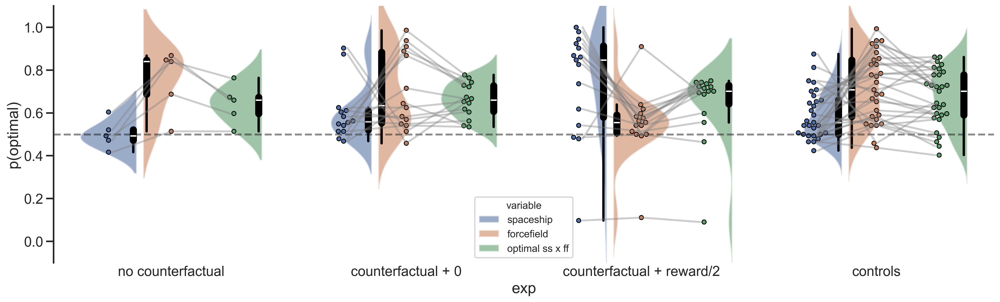

In [ ]:
df = pd.read_csv('../data/raw/controls_start_with_rl_7.csv')
df = df[df.expName.isin(['FullPilot', 'FullPilot2', 'FullPilot3', 'FullPilot4', 'FullPilot5', 'FullPilot6', 'FullPilot6.1', 'FullPilot7', 'FullPilot8'])]

df.loc[df.datetime.str.contains('2024-05-22') & (df.expName=='FullPilot6'), 'expName'] = 'FullPilot6.1'
df.loc[df.expName=='FullPilot6', 'expName'] = 'FullPilot6.2'
# exclude prolificID with less than 432 trials
# df = df.groupby('prolificID').filter(lambda x: len(x) >= 300)
df = df.groupby('prolificID').filter(lambda x: len(x) >= 432)

# keep  prolificIDs that are more than 10 characters
df = df[df.prolificID.str.len() > 10]

df['opti_ss'] = ((df.m1 > df.m2) & (df.choice==1)) | ((df.m1 < df.m2) & (df.choice==2))
df['opti_ff'] = ((df.p1 > df.p2) & (df.choice==1)) | ((df.p1 < df.p2) & (df.choice==2))
df['opti_ev'] = ((df.ev1 > df.ev2) & (df.choice==1)) | ((df.ev1 < df.ev2) & (df.choice==2))
import matplotlib.pyplot as plt


# ignore if pair < 0
df = df[df.pair >= 0]
df['pair2'] = df.pair.apply(lambda x: 'hard'  if x == 0 else 'easy')

sns.set(rc={'figure.figsize':(20, 5.5), 'figure.dpi':300})
# set all fonts bigger
sns.set_context('talk')
sns.set_style('ticks')
# sns.set_style('dark')
# plt.style.use('dark_background')
# sns.set_palette('dark')
# sns.set_theme(style='dark')



def plot(y='value', df=None):
    sns.violinplot(y=y, x='expName', hue='y', zorder=0, data=df, alpha=.6, linecolor='w', gap=.1, split=True, 
                     inner_kws={'color': 'black', 'linewidth': 0.5})
    sns.swarmplot(y=y, x='expName', hue='y', zorder=1,
                    data=df,dodge=True, edgecolor='black', linewidth=1)
    # connect swarm dots with grey lines
    xlim = plt.xlim()
    trace_lines_between_dots(df, y=y)
    # sns.lineplot(y=y, 
                #  x='expName', hue='pair2', zorder=2, style='pair2', 
                #    data=df_, alpha=1, color='grey', units='prolificID', estimator=None, legend=False
                #    )
    plt.xlim(xlim)
    plt.ylim(-.1, 1.1)
    # sns.pointplot(y=y, x='expName', hue='pair2', zorder=2, data=df_, dodge=True, ci=None, estimator=np.mean, markers='o', scale=1.5)
    
    
# trace grey lines between hue categories swarm dots
# to do that we need to get the x position of each prolificID in the swarmplot
# and then draw a line between each pair of dots
def trace_lines_between_dots(df=None, y='opti_ss'):
    for j, expname in enumerate(np.sort(df.expName.unique())):
        for i, name in enumerate(df_[df_.expName==expname].prolificID.unique()):
            d1 = df[(df.prolificID==name) & (df.expName==expname) & (df.y=='opti_ss')]['value']
            assert len(d1) == 1
            d2 = df[(df.prolificID==name) & (df.expName==expname) & (df.y=='opti_ff')]['value']
            assert len(d2) == 1
            d3 = df[(df.prolificID==name) & (df.expName==expname) & (df.y=='opti_ev')]['value']
            y2 = d2.values[0]
            y1 = d1.values[0]
            y3 = d3.values[0]
            plt.plot([j-.25, j, j+.25], [y1, y2, y3], 'grey', alpha=.4)


df_ = df[df.session.isin([2])]

exp = ['FullPilot6.2', 'FullPilot6.1', 'FullPilot7', 'FullPilot8']

df_ = df_.groupby(['expName', 'prolificID'], as_index=False).mean(numeric_only=True)
# df_ = df_[df_.prolificID!='654cebe5afd0bb3557331628']
df_ = df_[df_.expName.isin(exp)]
# rename expName to 1, 2, 3
df_.loc[df_.expName=='FullPilot6.2', 'expName'] = 1
df_.loc[df_.expName=='FullPilot6.1', 'expName'] = 3
df_.loc[df_.expName=='FullPilot7', 'expName'] = 2
df_.loc[df_.expName=='FullPilot8', 'expName'] = 4
# create a new df with col y= opti_ss, opti_ff, opti_ev, expName='FullPilot6.1', 'FullPilot7', value=mean(y)
df_ = pd.melt(df_, id_vars=['expName', 'prolificID'], value_vars=['opti_ss', 'opti_ff', 'opti_ev'], var_name='y', value_name='value')

# plt.subplot(1, 3, 1)

plt.plot([-0.5, len(exp)+.5], [0.5, 0.5], 'k--', alpha=0.5) 
plot(y='value', df=df_)
plt.ylabel('p(optimal)')
sns.despine()
plt.xlabel('exp')
#45 degree xticks
# plt.xticks(rotation=45)
# plt.legend([],[], frameon=False)
# only keep first two legend handles
handles = plt.gca().get_legend_handles_labels()[0]
plt.legend(handles[0:3], ['spaceship', 'forcefield', 'optimal ss x ff'], title='variable', loc='lower center', fontsize=12, title_fontsize=12)
# handle size

plt.tick_params(axis='x', length=0)
sns.despine(bottom=True)
plt.xticks([0, 1, 2, 3], ['no counterfactual', 'counterfactual + 0', 'counterfactual + reward/2', 'controls'])

C:\Users\basil\AppData\Local\Temp\ipykernel_18704\2733277918.py:51: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='m', y='choice_freq_m', data=m_freq, showfliers=False, boxprops=dict(alpha=0.5), zorder=-1, palette='viridis', linewidth=3)
C:\Users\basil\AppData\Local\Temp\ipykernel_18704\2733277918.py:53: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.stripplot(x='m', y='choice_freq_m',data=m_freq, alpha=0.9, size=6, zorder=1, edgecolor='black', linewidth=0.5, palette='viridis')


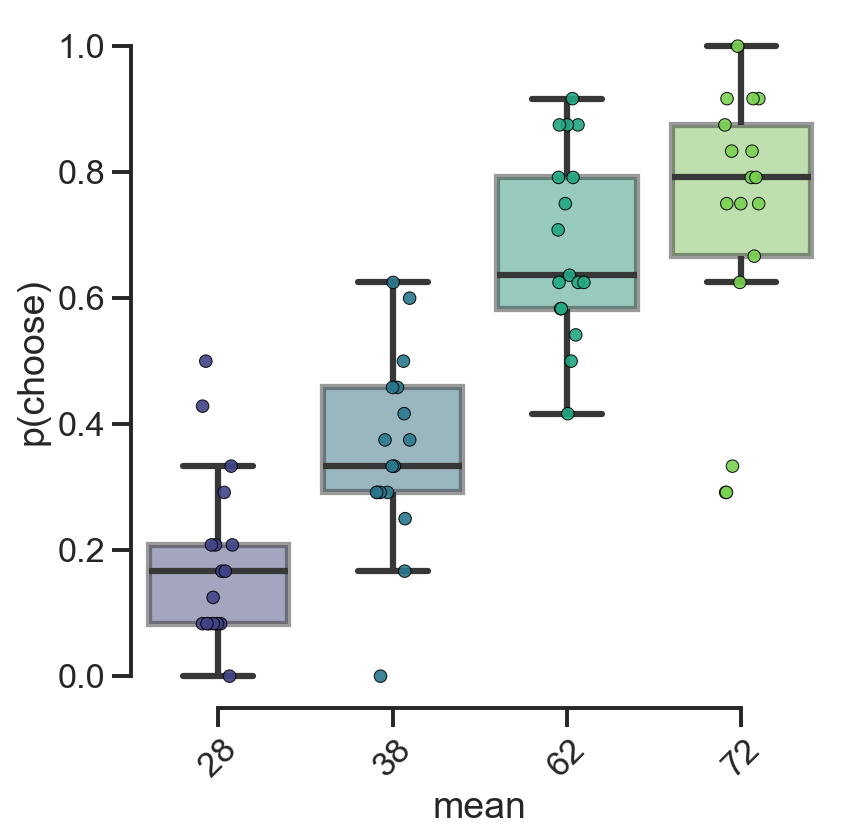

In [ ]:
df = pd.read_csv('../data/raw/control_40.csv')
df = df[df.expName=='FullPilot8']


df = df[df.session.isin([1])]
# ddf = df.copy()
# set id to prolificID
df['id'] = df.prolificID
# plot y as choice frequency for each p
# plot x as p
# plot size as N (number of trials with p)
# pp = np.unique(np.array([df.p1.unique(), df.p2.unique()]).flatten())
mm = np.unique(np.array([df.m1.unique(), df.m2.unique()]).flatten())
# print(pp)
# logit = lambda x: 1/(1+np.exp(-2*x))
# print(logit(np.linspace(-1, 1, 9)).round(2).tolist())
# assert sorted(pp) == logit(np.linspace(-1, 1, 9)).round(2).tolist()
p_freq = []
m_freq = []
for pid in df.id.unique():
    ddf = df[(df.id == pid)]
    # for p1 in pp:
    #     n_p1 = ((ddf.p1 == p1) | (ddf.p2 == p1)).sum()
    #     p_freq.append(
    #         {
    #          'id': pid,
    #          'p': p1,
    #          'choice_freq_p': ((ddf.p1 == p1) & (ddf.choice == 1) | (ddf.p2 == p1) & (ddf.choice == 2)).sum() / n_p1,
    #          'N_p': n_p1,
    #          'correct_p': ((ddf.p1 == p1) & (ddf.choice == 1)  & (ddf.p1 > ddf.p2) | (ddf.p2 == p1) & (ddf.choice == 2) & (ddf.p2 > ddf.p1)).sum() / n_p1,
    #         }
    #     )
    
    for m in mm:
        n_m = ((ddf.m1 == m) | (ddf.m2 == m)).sum()
        m_freq.append(
            {
              'id': pid,
             'm': m,
             'choice_freq_m': ((ddf.m1 == m) & (ddf.choice == 1) | (ddf.m2 == m) & (ddf.choice == 2)).sum() / n_m,
             'N_m': n_m,
             'correct_m': ((ddf.m1 == m) & (ddf.choice == 1)  & (ddf.m1 > ddf.m2) | (ddf.m2 == m) & (ddf.choice == 2) & (ddf.m2 > ddf.m1)).sum() / n_m,
            }
        ) 

p_freq = pd.DataFrame(p_freq)
m_freq = pd.DataFrame(m_freq)

# plt.figure(figsize=(5, 4), dpi=150)
sns.set(rc={'figure.figsize':(6, 6), 'figure.dpi':150})
sns.set_style('ticks')
sns.set_context('talk')
sns.boxplot(x='m', y='choice_freq_m', data=m_freq, showfliers=False, boxprops=dict(alpha=0.5), zorder=-1, palette='viridis', linewidth=3)   

sns.stripplot(x='m', y='choice_freq_m',data=m_freq, alpha=0.9, size=6, zorder=1, edgecolor='black', linewidth=0.5, palette='viridis')

# plot identity line
# plt.plot([0, len(pp)], [0, 1], color='black', linestyle='--', zorder=-10, alpha=0.8)
sns.despine(trim=True)
plt.ylabel('p(choose)')
plt.xlabel('mean')
plt.tick_params(axis='x', rotation=45)
# slides.add('bw.pptx')
# plot text for N on top of bars
# for i in range(d_freq.N
    # plt.text(i, d_freq.choice_freq[i], d_freq.N[i], ha='center', va='bottom')
# pairs = set(map(tuple, (np.array([df.p1, df.p2]).T)))
# pairs = sorted(pairs, key=lambda x: abs(x[0] - x[1]))

# count = 0
# for p in pp:
#     # (a) plot text for N p appears in a pair
#     # (b) plot N for N p appears in a pair and is best response
#     # must be a/b
#     a = sum([p in pair for pair in pairs])
#     b = sum([(p in pair) and (p == max(pair)) for pair in pairs])
#     plt.text(count, 0.5, f'{b}/{a}', ha='center', va='bottom', fontsize=8)
#     count += 1

[0.12, 0.18, 0.27, 0.38, 0.5, 0.62, 0.73, 0.82, 0.88]


C:\Users\basil\AppData\Local\Temp\ipykernel_18704\135190173.py:26: RuntimeWarning: invalid value encountered in scalar divide
  'choice_freq_p': ((ddf.p1 == p1) & (ddf.choice == 1) | (ddf.p2 == p1) & (ddf.choice == 2)).sum() / n_p1,
C:\Users\basil\AppData\Local\Temp\ipykernel_18704\135190173.py:28: RuntimeWarning: invalid value encountered in scalar divide
  'correct_p': ((ddf.p1 == p1) & (ddf.choice == 1)  & (ddf.p1 > ddf.p2) | (ddf.p2 == p1) & (ddf.choice == 2) & (ddf.p2 > ddf.p1)).sum() / n_p1,
C:\Users\basil\AppData\Local\Temp\ipykernel_18704\135190173.py:51: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x='p', y='choice_freq_p', data=p_freq, showfliers=False, boxprops=dict(alpha=0.5), zorder=-1, palette='viridis', linewidth=3)
C:\Users\basil\AppData\Local\Temp\ipykernel_18704\135190173.py:53: FutureWarning: 

Passing `palette` witho

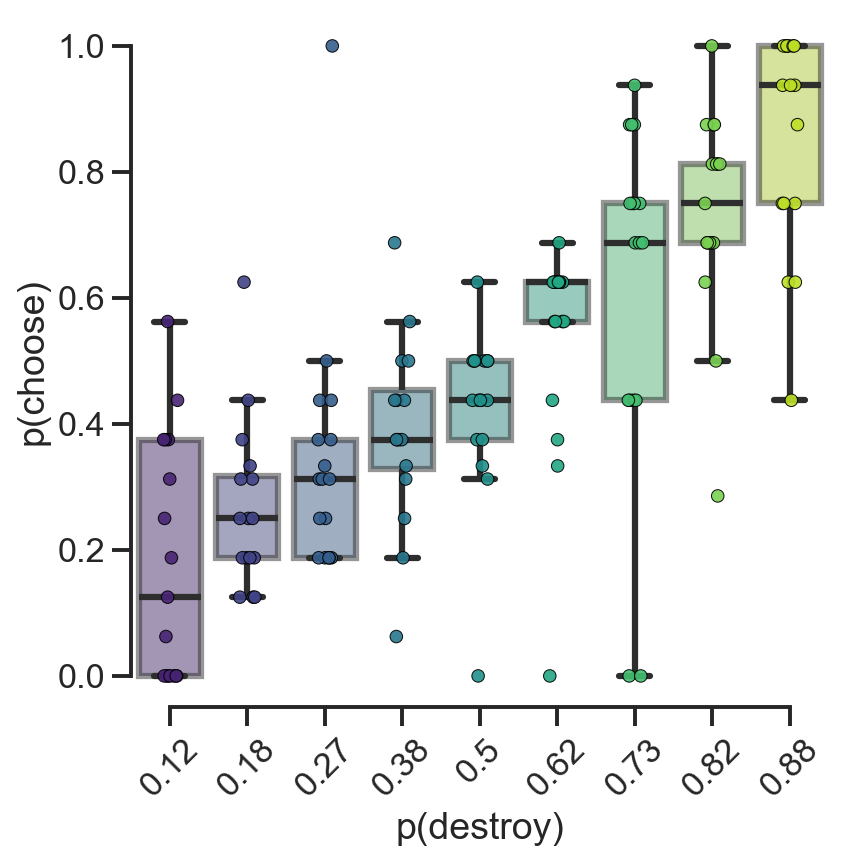

In [ ]:
df = pd.read_csv('../data/raw/controls14.csv')
df = df[df.expName=='FullPilot8']
df = df[df.session.isin([0])]
# ddf = df.copy()
# set id to prolificID
df['id'] = df.prolificID
# plot y as choice frequency for each p
# plot x as p
# plot size as N (number of trials with p)
pp = np.unique(np.array([df.p1.unique(), df.p2.unique()]).flatten())
# mm = np.unique(np.array([df.m1.unique(), df.m2.unique()]).flatten())
# print(pp)
logit = lambda x: 1/(1+np.exp(-2*x))
print(logit(np.linspace(-1, 1, 9)).round(2).tolist())
assert sorted(pp) == logit(np.linspace(-1, 1, 9)).round(2).tolist()
p_freq = []
m_freq = []
for pid in df.id.unique():
    ddf = df[(df.id == pid)]
    for p1 in pp:
        n_p1 = ((ddf.p1 == p1) | (ddf.p2 == p1)).sum()
        p_freq.append(
            {
             'id': pid,
             'p': p1,
             'choice_freq_p': ((ddf.p1 == p1) & (ddf.choice == 1) | (ddf.p2 == p1) & (ddf.choice == 2)).sum() / n_p1,
             'N_p': n_p1,
             'correct_p': ((ddf.p1 == p1) & (ddf.choice == 1)  & (ddf.p1 > ddf.p2) | (ddf.p2 == p1) & (ddf.choice == 2) & (ddf.p2 > ddf.p1)).sum() / n_p1,
            }
        )
    
    # for m in mm:
    #     n_m = ((ddf.m1 == m) | (ddf.m2 == m)).sum()
    #     m_freq.append(
    #         {
    #           'id': pid,
    #          'm': m,
    #          'choice_freq_m': ((ddf.m1 == m) & (ddf.choice == 1) | (ddf.m2 == m) & (ddf.choice == 2)).sum() / n_m,
    #          'N_m': n_m,
    #          'correct_m': ((ddf.m1 == m) & (ddf.choice == 1)  & (ddf.m1 > ddf.m2) | (ddf.m2 == m) & (ddf.choice == 2) & (ddf.m2 > ddf.m1)).sum() / n_m,
    #         }
    #     ) 

p_freq = pd.DataFrame(p_freq)
m_freq = pd.DataFrame(m_freq)

# plt.figure(figsize=(5, 4), dpi=150)
sns.set(rc={'figure.figsize':(6, 6), 'figure.dpi':150})
sns.set_style('ticks')
sns.set_context('talk')
sns.boxplot(x='p', y='choice_freq_p', data=p_freq, showfliers=False, boxprops=dict(alpha=0.5), zorder=-1, palette='viridis', linewidth=3)   

sns.stripplot(x='p', y='choice_freq_p',data=p_freq, alpha=0.9, size=6, zorder=1, edgecolor='black', linewidth=0.5, palette='viridis')

# plot identity line
# plt.plot([0, len(pp)], [0, 1], color='black', linestyle='--', zorder=-10, alpha=0.8)
sns.despine(trim=True)
plt.ylabel('p(choose)')
plt.xlabel('p(destroy)')
plt.tick_params(axis='x', rotation=45)
# slides.add('bw.pptx')
# plot text for N on top of bars
# for i in range(d_freq.N
    # plt.text(i, d_freq.choice_freq[i], d_freq.N[i], ha='center', va='bottom')
# pairs = set(map(tuple, (np.array([df.p1, df.p2]).T)))
# pairs = sorted(pairs, key=lambda x: abs(x[0] - x[1]))

# count = 0
# for p in pp:
#     # (a) plot text for N p appears in a pair
#     # (b) plot N for N p appears in a pair and is best response
#     # must be a/b
#     a = sum([p in pair for pair in pairs])
#     b = sum([(p in pair) and (p == max(pair)) for pair in pairs])
#     plt.text(count, 0.5, f'{b}/{a}', ha='center', va='bottom', fontsize=8)
#     count += 1

(0.0, 1.0)

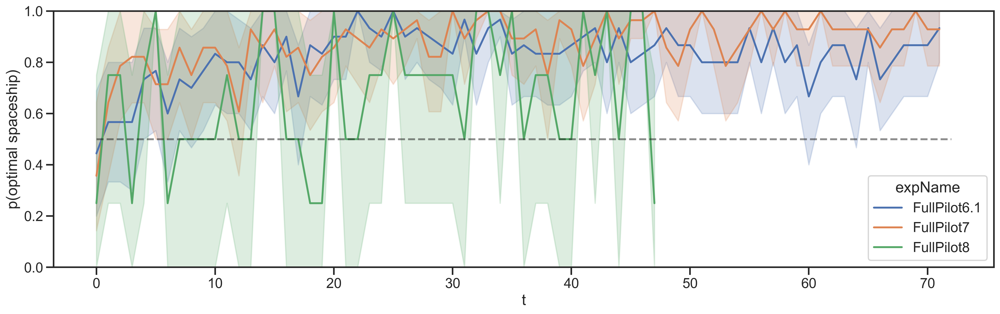

In [ ]:
# plot learning in session 1 over time (opti_ss)

df_ = df[df.session.isin([1])]
df_ = df_.groupby(['expName', 'prolificID', 't'], as_index=False).mean(numeric_only=True)
df_ = df_[df_.expName.isin(['FullPilot6.1', 'FullPilot7', 'FullPilot8'])]

sns.lineplot(x='t', y='opti_ss', hue='expName', data=df_)
plt.ylabel('p(optimal spaceship)')
plt.plot([0, 72], [0.5, 0.5], 'k--', alpha=0.5)
plt.ylim(0, 1)

In [ ]:
df_[df_.pair2=='easy'][['prolificID', 'opti_ss', 'opti_ff', 'opti_ev']].groupby('prolificID').mean()

,opti_ss,opti_ff,opti_ev
prolificID,,,
576ad50bc8a90000010d99c8,0.513889,0.597222,0.597222
5a3bdd2c8d005a0001829f3e,0.500000,0.944444,0.694444
5c95493ddd325800166f838a,0.791667,0.611111,0.736111
5d4b265b72db9d0015e8aac6,0.958333,0.555556,0.819444
5dc1eb838a84461511b3cd73,0.972222,0.527778,0.805556
5e307edef5abed05e1736185,0.555556,0.916667,0.708333
606b6705399a272af8238dad,0.791667,0.513889,0.680556
6079ff1600ff2b7455e1c3e0,1.000000,0.541667,0.861111
6117be8d81c34e0b13821371,0.448000,0.576000,0.480000


In [ ]:

df_[df_.pair2=='hard'][['prolificID', 'opti_ss', 'opti_ff', 'opti_ev']].groupby('prolificID').mean()

,opti_ss,opti_ff,opti_ev
prolificID,,,
576ad50bc8a90000010d99c8,0.652778,0.569444,0.638889
5c95493ddd325800166f838a,0.458333,0.638889,0.569444
5e307edef5abed05e1736185,0.555556,0.861111,0.819444
606b6705399a272af8238dad,0.861111,0.638889,0.750000
6117be8d81c34e0b13821371,0.488000,0.712000,0.600000
61230b14a3bcb65c585dfdaa,0.527778,0.916667,0.763889
62a96f8f6ab7e0c3ce90095f,0.930556,0.500000,0.638889
62ceba5fdab49dfc90278cbb,0.527778,0.500000,0.486111
63d13f416b2c25038c13007f,0.763889,0.597222,0.708333


In [ ]:
#2024-05-22 == fullpilot6.1
df.loc[df.datetime.str.contains('2024-05-22') & (df.expName=='FullPilot6'), 'expName'] = 'FullPilot6.1'
df.loc[df.expName=='FullPilot6', 'expName'] = 'FullPilot6.2'


c:\Python312\Lib\site-packages\seaborn\_core.py:1225: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  if pd.api.types.is_categorical_dtype(vector):


<Axes: xlabel='pair', ylabel='opti_ss'>

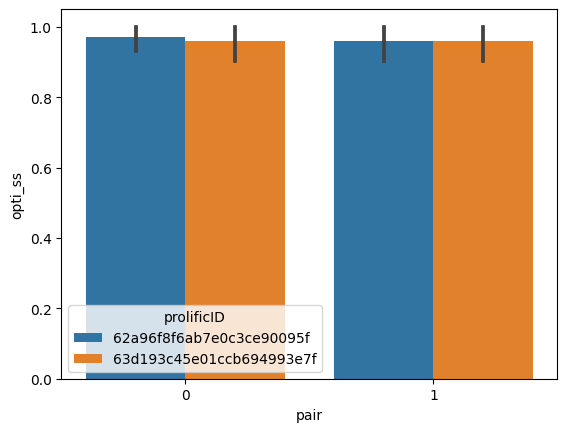

In [ ]:
df['opti_ss'] = df.choice==1 #((df.m1 > df.m2) & (df.choice==1)) | ((df.m1 < df.m2) & (df.choice==2))
dd = df[df.expName=='FullPilot6']
dd = dd[dd.session.isin([3])]

sns.barplot(y='opti_ss', x='pair', hue='prolificID',  data=dd)

AttributeError: Rectangle.set() got an unexpected keyword argument 'errorbar'

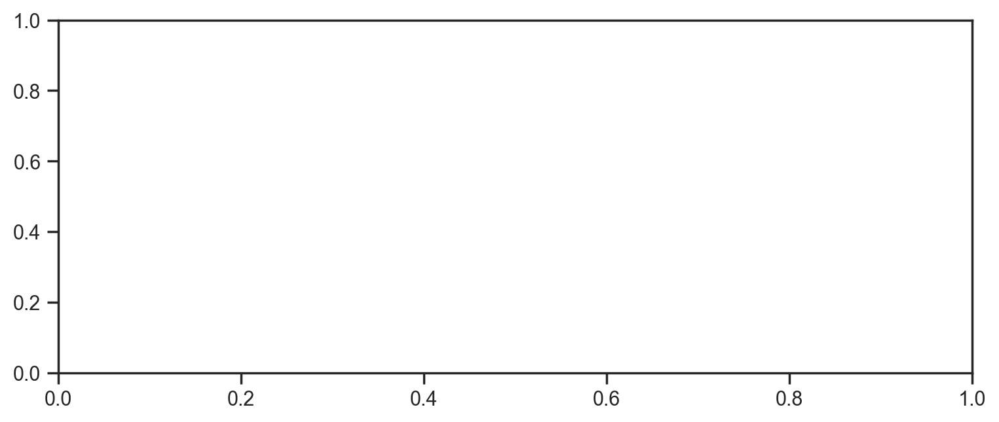

In [ ]:

sns.barplot(
    x='expName', y='score', data=df.groupby(['prolificID', 'expName'], as_index=True).score.max().reset_index(), errorbar='se',
    order=['FullPilot', 'FullPilot2', 'FullPilot3', 'FullPilot4', 'FullPilot5'])

In [ ]:
# compute ev delta 
df['ev_delta'] = (df.ev1 - df.ev2).abs()

plt.figure(figsize=(15, 5))
# show linear regression of ev delta on correct
sns.lmplot(x='ev_delta', y='correct', data=df[df.session.isin([2,3])])

#show that with pointplot
sns.pointplot(x='ev_delta', y='correct', linestyle='none', join=False,
              data=df[df.session.isin([2,3])].groupby(['prolificID', 'ev_delta'], as_index=False).mean())

plt.ylim(0,1)

# angle xticks
plt.xticks(rotation=45)

NameError: name 'plt' is not defined

2580
-2
-1
0
1


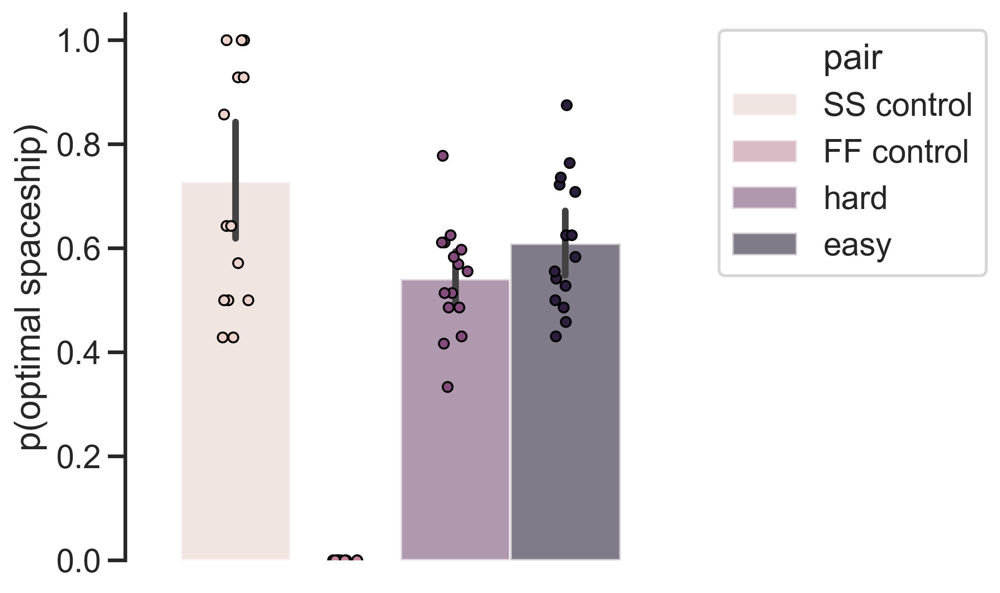

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
# df = df.groupby('prolificID').filter(lambda x: len(x) >= 300)

sns.set(rc={'figure.figsize':(5, 5), 'figure.dpi':300})
sns.set_context('talk')
sns.set_style('ticks')  
sns.set_palette('Set2')
df = pd.read_csv('../data/raw/controls14.csv')

df = df[df.expName.isin(['FullPilot', 'FullPilot2', 'FullPilot3', 'FullPilot4', 'FullPilot5', 'FullPilot6', 'FullPilot6.1', 'FullPilot7', 'FullPilot8'])]

# exclude prolificID with less than 432 trials
df = df.groupby('prolificID').filter(lambda x: len(x) >= 432)
# keep  prolificIDs that are more than 10 characters
df = df[df.prolificID.str.len() > 10]

# df = df[(df.prolificID=='unity') & df.datetime.str.contains('2024-06-04')] 

df = df[(df.session==3) & (df.expName=='FullPilot8')]
# drop duplicates
df = df.drop_duplicates(subset=['expName', 'session', 't', 'prolificID'], keep='last')
print(len(df))
# 
df['opti_ev'] = ((df.ev1 > df.ev2) & (df.choice==1)) | ((df.ev1 < df.ev2) & (df.choice==2))
df['opti_ff'] = ((df.p1 > df.p2) & (df.choice==1)) | ((df.p1 < df.p2) & (df.choice==2))
df['opti_ss'] = ((df.m1 > df.m2) & (df.choice==1)) | ((df.m1 < df.m2) & (df.choice==2))

df = df.groupby(['expName', 'prolificID', 'pair'], as_index=False).mean(numeric_only=True)
sns.set_palette('Set2')
sns.barplot(x='expName', y='opti_ss', hue="pair", data=df, alpha=.6)
sns.stripplot(x='expName', y='opti_ss', hue="pair", data=df, dodge=True, edgecolor='black', linewidth=1)

plt.ylabel('p(optimal spaceship)')
plt.xlabel('')
#get x position of each bar from plt
x = [p.get_x() + p.get_width() / 2 for p in plt.gca().patches]

# add number of trial per pair in the legend
count = 0
for pair in sorted(df.pair.unique()):
    print(pair)
    n = len(df[(df.expName=='FullPilot8') & (df.pair==pair)])
    # plt.text(x=x[count], y=0.5, s=n, ha='center', va='center')
    count += 1
    
plt.xlabel('')
plt.xticks([])
sns.despine(bottom=True)


# get handles and labels of the legend
handles, labels = plt.gca().get_legend_handles_labels()
#set legend outside of the plot on the right
plt.legend(title='pair', handles=handles[:-4], bbox_to_anchor=(1.05, 1), loc='upper left', labels=['SS control', 'FF control', 'hard', 'easy'])


2580
-2
-1
0
1


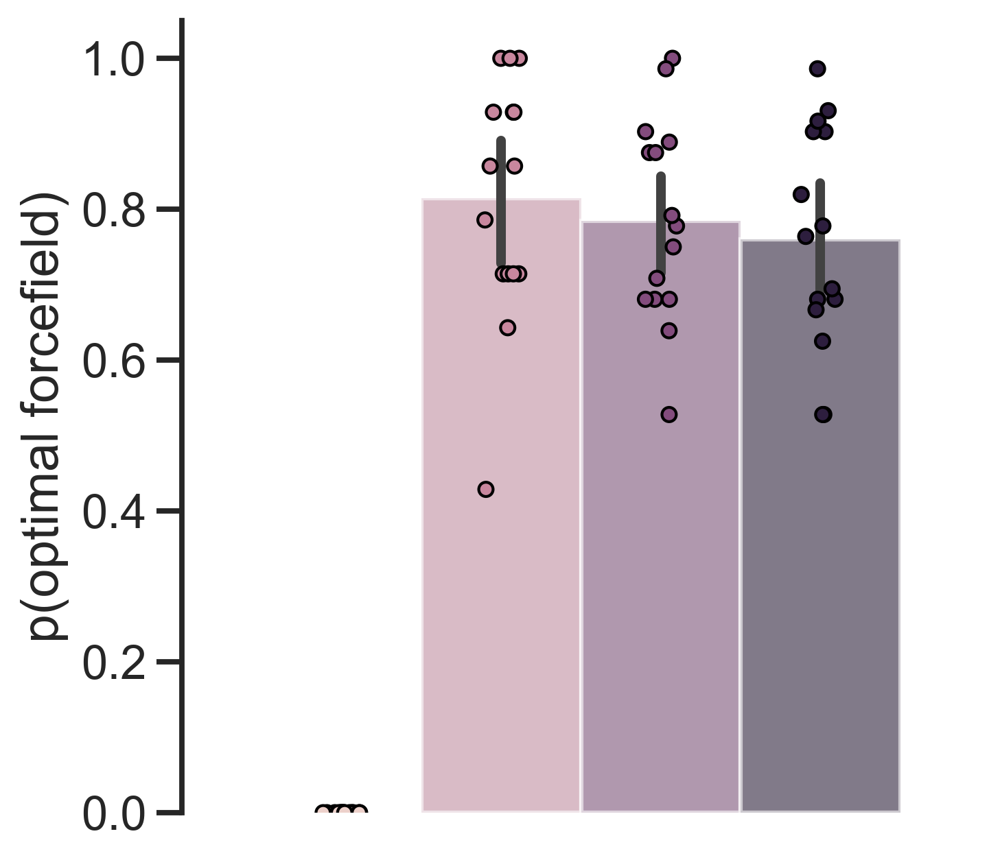

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
# df = df.groupby('prolificID').filter(lambda x: len(x) >= 300)

sns.set(rc={'figure.figsize':(5, 5), 'figure.dpi':300})
sns.set_context('talk')
sns.set_style('ticks')  
sns.set_palette('Set2')
df = pd.read_csv('../data/raw/controls14.csv')

df = df[df.expName.isin(['FullPilot', 'FullPilot2', 'FullPilot3', 'FullPilot4', 'FullPilot5', 'FullPilot6', 'FullPilot6.1', 'FullPilot7', 'FullPilot8'])]

# exclude prolificID with less than 432 trials
df = df.groupby('prolificID').filter(lambda x: len(x) >= 432)
# keep  prolificIDs that are more than 10 characters
df = df[df.prolificID.str.len() > 10]

# df = df[(df.prolificID=='unity') & df.datetime.str.contains('2024-06-04')] 

df = df[(df.session==3) & (df.expName=='FullPilot8')]
# drop duplicates
df = df.drop_duplicates(subset=['expName', 'session', 't', 'prolificID'], keep='last')
print(len(df))

df['p1'] = df.apply(lambda x: 1 if x.pair == -2 else x.p1, axis=1)
df['p2'] = df.apply(lambda x: 1 if x.pair == -2 else x.p2, axis=1)
# 
df['opti_ev'] = ((df.ev1 > df.ev2) & (df.choice==1)) | ((df.ev1 < df.ev2) & (df.choice==2))
df['opti_ff'] = ((df.p1 > df.p2) & (df.choice==1)) | ((df.p1 < df.p2) & (df.choice==2))
df['opti_ss'] = ((df.m1 > df.m2) & (df.choice==1)) | ((df.m1 < df.m2) & (df.choice==2))

df = df.groupby(['expName', 'prolificID', 'pair'], as_index=False).mean(numeric_only=True)
sns.set_palette('Set2')
sns.barplot(x='expName', y='opti_ff', hue="pair", data=df, alpha=.6)
sns.stripplot(x='expName', y='opti_ff', hue="pair", data=df, dodge=True,linewidth=1, edgecolor='black')

plt.ylabel('p(optimal forcefield)')
plt.xlabel('')
plt.xticks([])
sns.despine(bottom=True)
#get x position of each bar from plt
x = [p.get_x() + p.get_width() / 2 for p in plt.gca().patches]

# add number of trial per pair in the legend
count = 0
for pair in sorted(df.pair.unique()):
    print(pair)
    n = len(df[(df.expName=='FullPilot8') & (df.pair==pair)])
    # plt.text(x=x[count], y=0.5, s=n, ha='center', va='center')
    count += 1
    
plt.legend([],[], frameon=False)
# get handles and labels of the legend
# handles, labels = plt.gca().get_legend_handles_labels()
#set legend outside of the plot on the right
# plt.legend(title='pair', handles=handles[:-4], bbox_to_anchor=(1.05, 1), loc='upper left', labels=['SS control', 'FF control', 'hard', 'easy'])


In [ ]:
df = pd.read_csv('../data/raw/controls14.csv')
df = df[(df.session==1) & (df.expName=='FullPilot8')]
df[df.pair==0]

,prolificID,expName,session,t,pair,choice,outcome1,outcome2,choseLeft,op1IsLeft,...,ev2,p1,p2,m1,m2,name1,name2,destroyed,score,datetime
50383,unity,FullPilot8,1,0,0,1,70,37,1,1,...,38,1.0,1.0,62,38,FFEnemyShipNocolors1,FFEnemyShipNoColors12,1,70,2024-06-04 20:59:48
50389,unity,FullPilot8,1,4,0,1,53,16,1,1,...,38,1.0,1.0,62,38,FFEnemyShipNocolors1,FFEnemyShipNoColors12,1,292,2024-06-04 21:00:49
50422,test,FullPilot8,1,0,0,1,61,25,0,0,...,38,1.0,1.0,62,38,FFEnemyShipNocolors1,FFEnemyShipNoColors12,1,61,2024-06-04 21:19:15
50423,test,FullPilot8,1,1,0,1,58,46,0,0,...,38,1.0,1.0,62,38,FFEnemyShipNocolors1,FFEnemyShipNoColors12,1,119,2024-06-04 21:19:19
50426,test,FullPilot8,1,4,0,0,65,32,0,1,...,38,1.0,1.0,62,38,FFEnemyShipNocolors1,FFEnemyShipNoColors12,0,185,2024-06-04 21:19:38
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
57376,5685850c333cbd000d4e042f,FullPilot8,1,29,0,1,53,28,1,1,...,38,1.0,1.0,62,38,FFEnemyShipNocolors1,FFEnemyShipNoColors12,1,1948,2024-06-05 15:24:55
57389,5685850c333cbd000d4e042f,FullPilot8,1,37,0,1,57,49,0,0,...,38,1.0,1.0,62,38,FFEnemyShipNocolors1,FFEnemyShipNoColors12,1,2416,2024-06-05 15:25:24
57396,5685850c333cbd000d4e042f,FullPilot8,1,42,0,1,61,24,0,0,...,38,1.0,1.0,62,38,FFEnemyShipNocolors1,FFEnemyShipNoColors12,1,2703,2024-06-05 15:25:43
57397,5685850c333cbd000d4e042f,FullPilot8,1,43,0,1,43,49,0,0,...,38,1.0,1.0,62,38,FFEnemyShipNocolors1,FFEnemyShipNoColors12,1,2746,2024-06-05 15:25:47
